<a href="https://colab.research.google.com/github/mameaicha/gomycodeMAC/blob/main/Unsupervised_Learning_Clustering_Checkpoint2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Objectif**:

Développer une segmentation de la clientèle afin de définir une stratégie marketing. L'échantillon de données  utilisé résume le comportement d'utilisation d'environ 9000 détenteurs actifs de cartes de crédit au cours des 6 derniers mois avec 18 variables comportementales.

# **Instructions**:

## 1. **Load your dataset**

In [1]:
# Make sure that we have the latest version of pandas-profiling.
!pip install -U pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 49.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 87.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=188919f40510352aff246c77df6cc831d73d77dec72db12632e6fa3b0abcd922
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [2]:
#data analysis libraries
import numpy as np
import pandas as pd

#visualization libraries
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
%matplotlib inline
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from itertools import product
import math as mt
import missingno as msno # for missing data


# Preprocessing Data
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Modeling
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering, Birch
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler

from scipy.cluster.hierarchy import dendrogram, linkage

# profiling and data download
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

# Handling Warning
import warnings
warnings.filterwarnings('ignore')

In [3]:
# load and read dataset
file_name = cache_file(
    "CC_GENERAL.csv",
    "https://drive.google.com/u/0/uc?id=1P_jFdkc6FEai2W3RwcF5z5UIA60Our4Q&export=download",
)

data = pd.read_csv(file_name,sep=",")
# make a copy
df=data

### 1.1 **Analyse exploratoire des données (EDA)**


#### 1.1.1 **Analyse de forme**


In [ ]:
# columns names
print(df.columns.values)

['CUST_ID' 'BALANCE' 'BALANCE_FREQUENCY' 'PURCHASES' 'ONEOFF_PURCHASES'
 'INSTALLMENTS_PURCHASES' 'CASH_ADVANCE' 'PURCHASES_FREQUENCY'
 'ONEOFF_PURCHASES_FREQUENCY' 'PURCHASES_INSTALLMENTS_FREQUENCY'
 'CASH_ADVANCE_FREQUENCY' 'CASH_ADVANCE_TRX' 'PURCHASES_TRX'
 'CREDIT_LIMIT' 'PAYMENTS' 'MINIMUM_PAYMENTS' 'PRC_FULL_PAYMENT' 'TENURE']


In [ ]:
pd.set_option('display.max_column',111)
df.head(8)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
6,C10007,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.0,6354.314328,198.065894,1.000000,12
7,C10008,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.0,679.065082,532.033990,0.000000,12


- **Nombre de lignes et de colonnes**

In [ ]:
# nomber of lines and columns
df.shape

(8950, 18)

- **Type des variables**

In [ ]:
#types of variabl
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [ ]:
df.dtypes.value_counts()

float64    14
int64       3
object      1
dtype: int64

In [ ]:
num_feat = list(df.dtypes[df.dtypes != 'object'].index)
categ_feat = list(df.dtypes[df.dtypes == 'object'].index)
print("Categorical features:", categ_feat)
print("Numerical features:", num_feat)

Categorical features: ['CUST_ID']
Numerical features: ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']


Parfois  le type par defaut d'une variable peut ne pas correspondre avec la nature ou la fonction de celle-ci.  Il convient déslors de faire des reclassement des variable selon leur vrai type.

In [4]:

#classification or reclassification of variables according to type or function:
# view on https://www.kaggle.com/code/ozlemilgun/the-prediction-of-titanic-passengers-survival

def grab_col_names(dataframe, cat_th=5, car_th=20):
    """
    This function to perform the selection of numeric and categorical variables in the data set in a parametric way.
    Note: Variables with numeric data type but with categorical properties are included in categorical variables.

    Parameters
    ----------
    dataframe: dataframe
        The data set in which Variable types need to be parsed
    cat_th: int, optional
        The threshold value for number of distinct observations in numerical variables with categorical properties.
        cat_th is used to specify that if number of distinct observations in numerical variable is less than
        cat_th, this variables can be categorized as a categorical variable.

    car_th: int, optional
        The threshold value for categorical variables with  a wide range of cardinality.
        If the number of distinct observations in a categorical variables is greater than car_th, this
        variable can be categorized as a categorical variable.

    Returns
    -------
        cat_cols: list
            List of categorical variables.
        num_cols: list
            List of numerical variables.
        cat_but_car: list
            List of categorical variables with  a wide range of cardinality.

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))

    Notes
    ------
        Sum of elements in lists the cat_cols,num_cols  and  cat_but_car give the total number of variables in dataframe.
    """

    # cat cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].dtypes != "O" and
                   dataframe[col].nunique() < cat_th]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].dtypes == "O" and
                   dataframe[col].nunique() > car_th]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O" and "ID" not in col.upper()]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    return cat_cols,num_cols,cat_but_car


In [ ]:
grab_col_names(df)

([],
 ['BALANCE',
  'BALANCE_FREQUENCY',
  'PURCHASES',
  'ONEOFF_PURCHASES',
  'INSTALLMENTS_PURCHASES',
  'CASH_ADVANCE',
  'PURCHASES_FREQUENCY',
  'ONEOFF_PURCHASES_FREQUENCY',
  'PURCHASES_INSTALLMENTS_FREQUENCY',
  'CASH_ADVANCE_FREQUENCY',
  'CASH_ADVANCE_TRX',
  'PURCHASES_TRX',
  'CREDIT_LIMIT',
  'PAYMENTS',
  'MINIMUM_PAYMENTS',
  'PRC_FULL_PAYMENT',
  'TENURE'],
 ['CUST_ID'])

Pas de variables cathégorielles

In [5]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)


#### 1.1.2 **Analyse de fond**

In [6]:
# Check detailed info for each feature
listItem = []
#for col in df.columns :
for col in num_cols :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'missing value', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,missing value,nullPct,unique,uniqueSample
0,BALANCE,float64,0,0.00,8871,"[35.120942, 821.916526]"
1,BALANCE_FREQUENCY,float64,0,0.00,43,"[0.888889, 0.714286]"
2,PURCHASES,float64,0,0.00,6203,"[78.0, 2816.01]"
3,ONEOFF_PURCHASES,float64,0,0.00,4014,"[1341.62, 264.35]"
4,INSTALLMENTS_PURCHASES,float64,0,0.00,4452,"[4037.21, 669.0]"
5,CASH_ADVANCE,float64,0,0.00,4323,"[2539.708186, 1365.172054]"
6,PURCHASES_FREQUENCY,float64,0,0.00,47,"[0.142857, 0.4]"
7,ONEOFF_PURCHASES_FREQUENCY,float64,0,0.00,47,"[0.666667, 0.545455]"
8,PURCHASES_INSTALLMENTS_FREQUENCY,float64,0,0.00,47,"[0.916667, 0.333333]"
9,CASH_ADVANCE_FREQUENCY,float64,0,0.00,54,"[0.363636, 0.2]"


**Doublons**:

Ce dataset ne contient pas de doublons

**Valeurs manquantes**:

Il apparaît que seul deux variables ont des valeurs manquantes:

 - CREDIT_LIMIT ne comporte qu'une seule valeur manquante

- MINIMUM_PAYMENTS a 313 valeurs manquantes.

- **Résumé statistique**

In [8]:
# Creating Data audit Report
# Use a general function that returns multiple values
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()],
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

data_num = df[num_cols]
num_summary=data_num.apply(lambda x: var_summary(x)).T

In [9]:
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
BALANCE,8950.0,0.0,1.400205e+07,1564.474828,873.385231,2081.531879,4.332775e+06,0.000000,0.065101,8.814518,23.575529,128.281915,873.385231,2054.140036,4338.563657,5909.111808,9338.804814,19043.13856
BALANCE_FREQUENCY,8950.0,0.0,7.851573e+03,0.877271,1.000000,0.236904,5.612351e-02,0.000000,0.090909,0.272727,0.454545,0.888889,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000
PURCHASES,8950.0,0.0,8.978683e+06,1003.204834,361.280000,2136.634782,4.565208e+06,0.000000,0.000000,0.000000,0.000000,39.635000,361.280000,1110.130000,2542.624000,3998.619500,8977.290000,49039.57000
ONEOFF_PURCHASES,8950.0,0.0,5.302314e+06,592.437371,38.000000,1659.887917,2.755228e+06,0.000000,0.000000,0.000000,0.000000,0.000000,38.000000,577.405000,1600.099000,2671.094000,6689.898200,40761.25000
INSTALLMENTS_PURCHASES,8950.0,0.0,3.679055e+06,411.067645,89.000000,904.338115,8.178274e+05,0.000000,0.000000,0.000000,0.000000,0.000000,89.000000,468.637500,1140.070000,1750.087500,3886.240500,22500.00000
CASH_ADVANCE,8950.0,0.0,8.760896e+06,978.871112,0.000000,2097.163877,4.398096e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1113.821139,3065.534560,4647.169122,9588.163357,47137.21176
PURCHASES_FREQUENCY,8950.0,0.0,4.388637e+03,0.490351,0.500000,0.401371,1.610985e-01,0.000000,0.000000,0.000000,0.000000,0.083333,0.500000,0.916667,1.000000,1.000000,1.000000,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.0,1.811996e+03,0.202458,0.083333,0.298336,8.900441e-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.300000,0.750000,1.000000,1.000000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.0,3.261714e+03,0.364437,0.166667,0.397448,1.579647e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.750000,1.000000,1.000000,1.000000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.0,1.209541e+03,0.135144,0.000000,0.200121,4.004857e-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.416667,0.583333,0.833333,1.50000


In [10]:
# creating function for detailed descriptive analytic
def summary_stats(df, n=4):
    # central tendency: mean, median
    mean = pd.DataFrame(df.apply(np.mean)).T
    median = pd.DataFrame(df.apply(np.median)).T

    # distribution: ,std, min, max, range, skew, kurtosis
    std = pd.DataFrame(df.apply(np.std)).T
    min_value = pd.DataFrame(df.apply(min)).T
    max_value = pd.DataFrame(df.apply(max)).T
    range_value = pd.DataFrame(df.apply(lambda x: x.max() - x.min())).T
    skewness = pd.DataFrame(df.apply(lambda x: x.skew())).T
    kurtosis = pd.DataFrame(df.apply(lambda x: x.kurtosis())).T

    # concatenates
    summary_stats = pd.concat([min_value, max_value, range_value, mean, median, std, skewness, kurtosis]).T.reset_index()
    summary_stats.columns = ['attributes','min','max', 'range','mean','median', 'std','skewness','kurtosis']

    return round(summary_stats, n)

In [11]:
# descriptive analytic for modeling feature
summary_stats(df[num_cols])

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,BALANCE,0.0000,19043.1386,19043.1386,1564.4748,873.3852,2081.4156,2.3934,7.6748
1,BALANCE_FREQUENCY,0.0000,1.0000,1.0000,0.8773,1.0000,0.2369,-2.0233,3.0924
2,PURCHASES,0.0000,49039.5700,49039.5700,1003.2048,361.2800,2136.5154,8.1443,111.3888
3,ONEOFF_PURCHASES,0.0000,40761.2500,40761.2500,592.4374,38.0000,1659.7952,10.0451,164.1876
4,INSTALLMENTS_PURCHASES,0.0000,22500.0000,22500.0000,411.0676,89.0000,904.2876,7.2991,96.5752
5,CASH_ADVANCE,0.0000,47137.2118,47137.2118,978.8711,0.0000,2097.0467,5.1666,52.8994
6,PURCHASES_FREQUENCY,0.0000,1.0000,1.0000,0.4904,0.5000,0.4013,0.0602,-1.6386
7,ONEOFF_PURCHASES_FREQUENCY,0.0000,1.0000,1.0000,0.2025,0.0833,0.2983,1.5356,1.1618
8,PURCHASES_INSTALLMENTS_FREQUENCY,0.0000,1.0000,1.0000,0.3644,0.1667,0.3974,0.5092,-1.3986
9,CASH_ADVANCE_FREQUENCY,0.0000,1.5000,1.5000,0.1351,0.0000,0.2001,1.8287,3.3347


- **Visualisation des tous les variables**

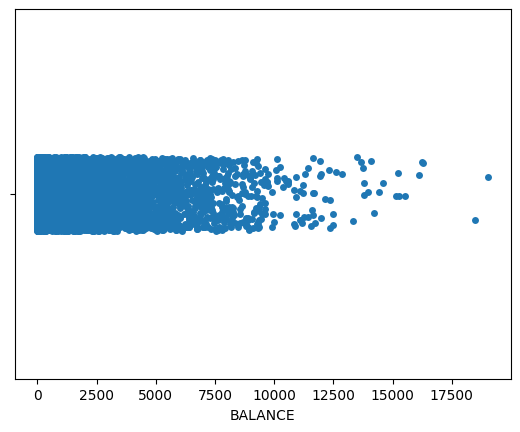

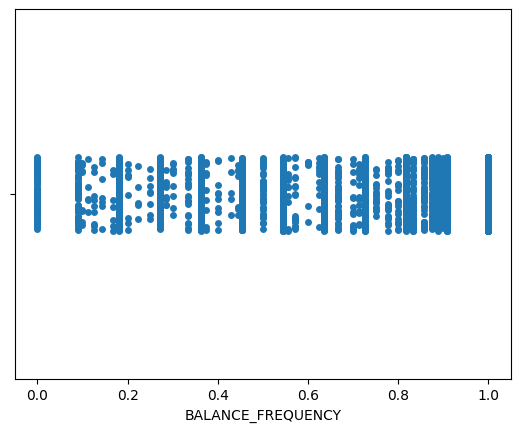

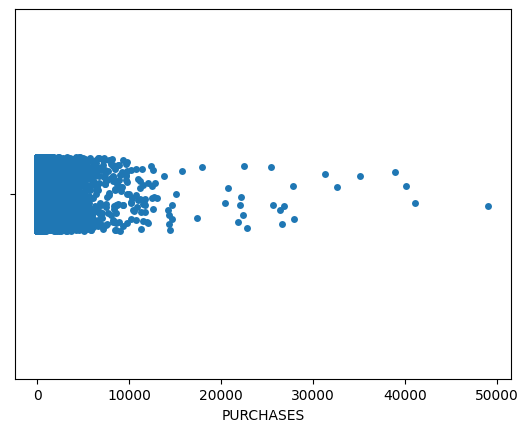

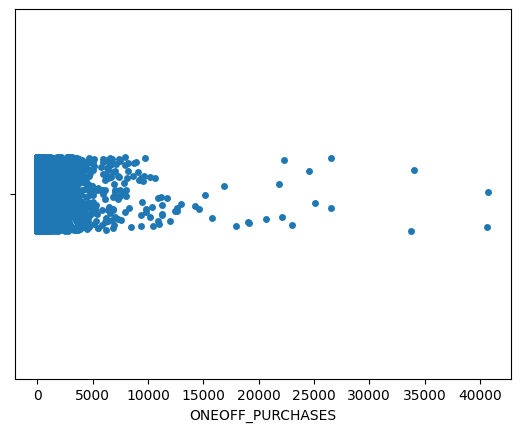

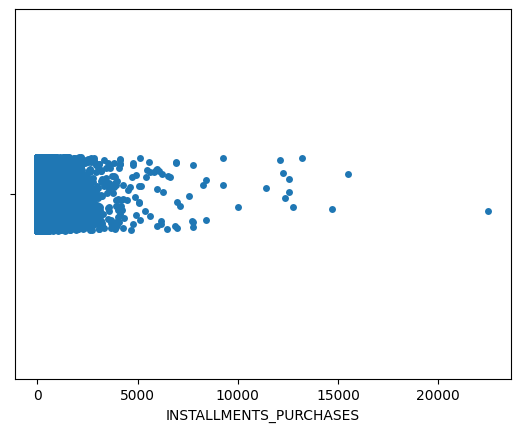

...

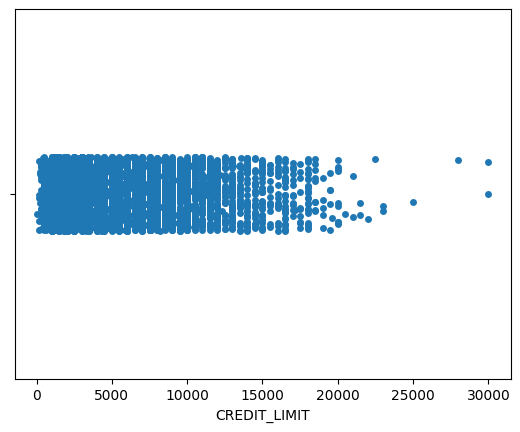

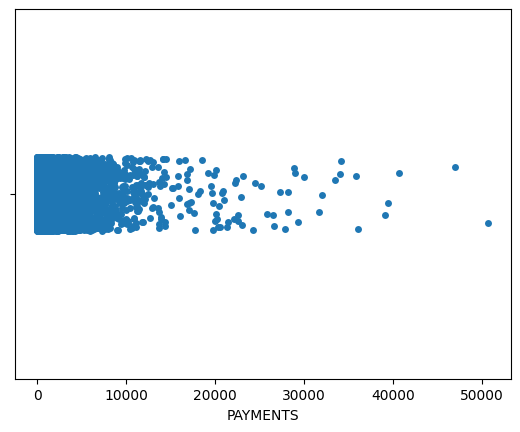

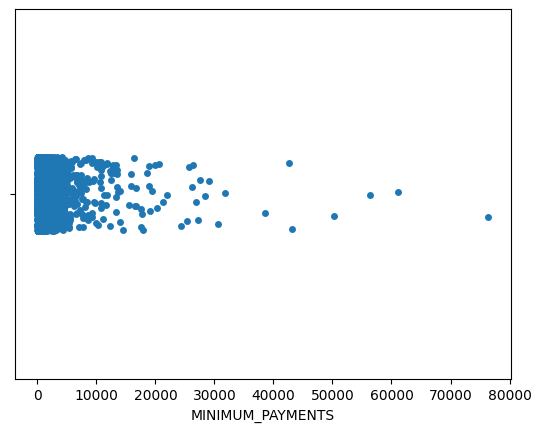

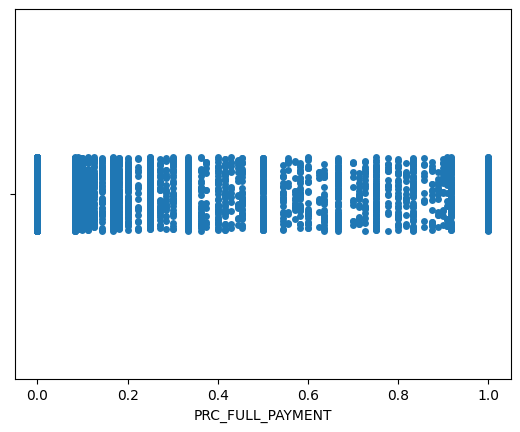

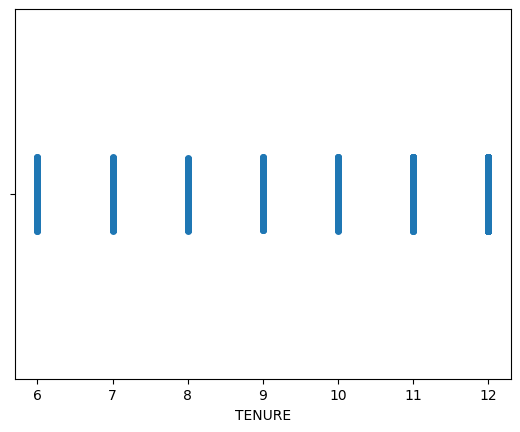

In [ ]:

# represent all values on a pseudo point cloud. With striplot
for i, col in enumerate(cat_cols + num_cols):
    plt.figure(i)
    sns.stripplot(x = col, data = df, jitter = True)

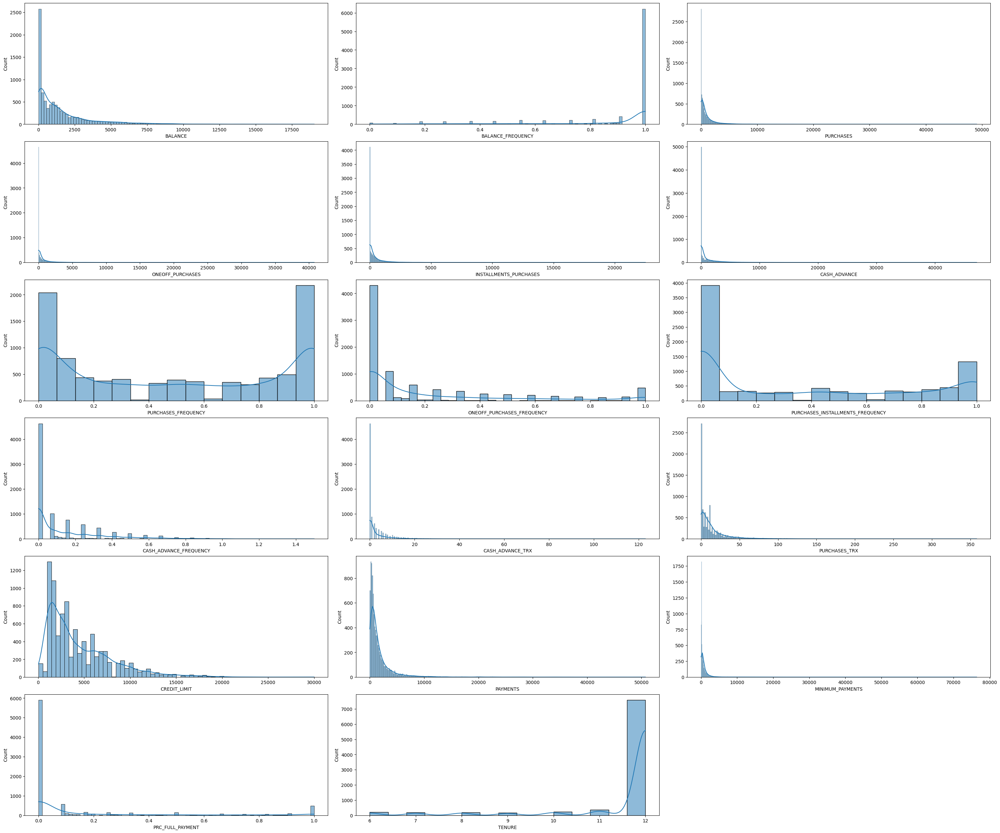

In [ ]:
# creating distribution plot for analysis
fig = plt.figure(figsize=(30, 25), constrained_layout=True)
for i in range(len(num_cols)):
    plt.subplot(6, 3, i+1)
    sns.histplot(df[num_cols[i]], kde=True)

In [ ]:
# General Exploration for Numerical Variables:

def num_summary(dataframe,  plot=False):
    quantiles = [0.25, 0.50, 0.75, 1]
    for col_name in num_cols:
        print("########## Summary Statistics of " +  col_name + " ############")
        print(dataframe[col_name].describe(quantiles).T)

        if plot:
            sns.histplot(data=dataframe, x=col_name  )
            plt.xlabel(col_name)
            plt.title("The distribution of "+ col_name)
            plt.grid(True)
            plt.show(block=True)

########## Summary Statistics of BALANCE ############
count     8950.000000
mean      1564.474828
std       2081.531879
min          0.000000
25%        128.281915
50%        873.385231
75%       2054.140036
100%     19043.138560
max      19043.138560
Name: BALANCE, dtype: float64


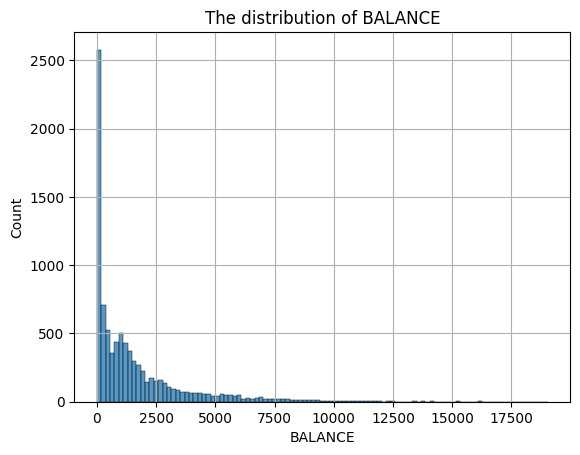

########## Summary Statistics of BALANCE_FREQUENCY ############
count    8950.000000
mean        0.877271
std         0.236904
min         0.000000
25%         0.888889
50%         1.000000
75%         1.000000
100%        1.000000
max         1.000000
Name: BALANCE_FREQUENCY, dtype: float64


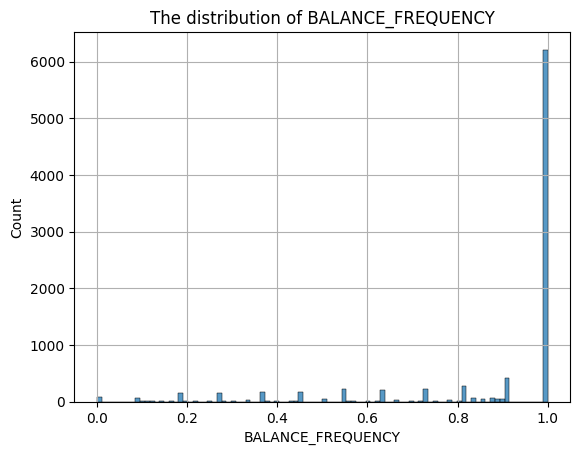

########## Summary Statistics of PURCHASES ############
count     8950.000000
mean      1003.204834
std       2136.634782
min          0.000000
25%         39.635000
50%        361.280000
75%       1110.130000
100%     49039.570000
max      49039.570000
Name: PURCHASES, dtype: float64


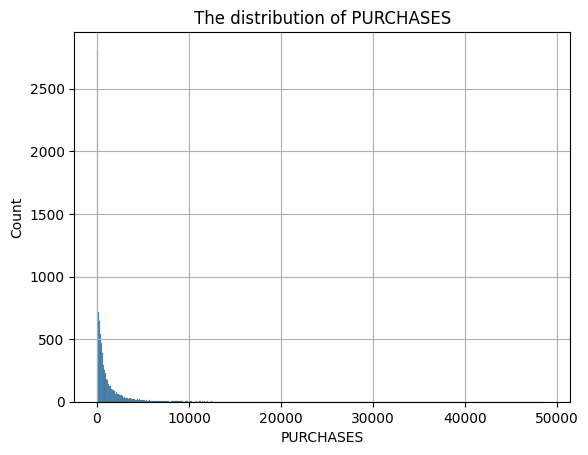

########## Summary Statistics of ONEOFF_PURCHASES ############
count     8950.000000
mean       592.437371
std       1659.887917
min          0.000000
25%          0.000000
50%         38.000000
75%        577.405000
100%     40761.250000
max      40761.250000
Name: ONEOFF_PURCHASES, dtype: float64


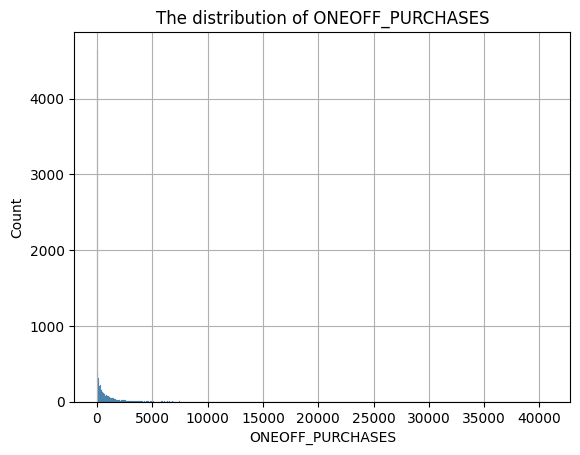

########## Summary Statistics of INSTALLMENTS_PURCHASES ############
count     8950.000000
mean       411.067645
std        904.338115
min          0.000000
25%          0.000000
50%         89.000000
75%        468.637500
100%     22500.000000
max      22500.000000
Name: INSTALLMENTS_PURCHASES, dtype: float64


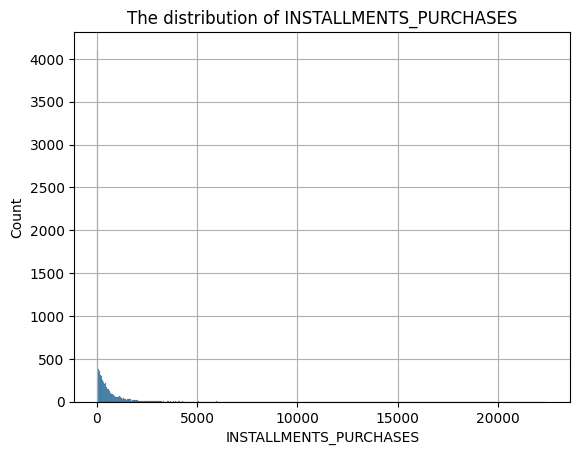

########## Summary Statistics of CASH_ADVANCE ############
count     8950.000000
mean       978.871112
std       2097.163877
min          0.000000
25%          0.000000
50%          0.000000
75%       1113.821139
100%     47137.211760
max      47137.211760
Name: CASH_ADVANCE, dtype: float64


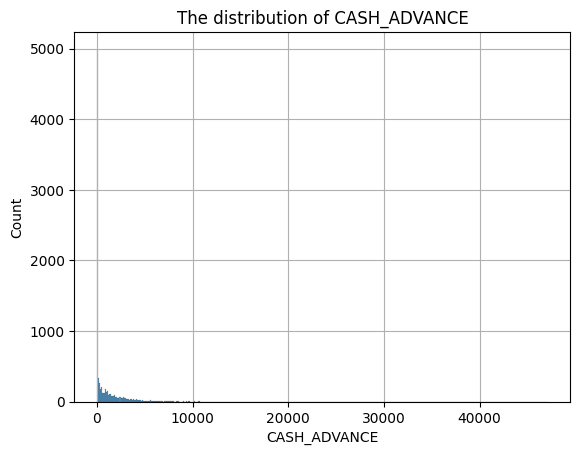

########## Summary Statistics of PURCHASES_FREQUENCY ############
count    8950.000000
mean        0.490351
std         0.401371
min         0.000000
25%         0.083333
50%         0.500000
75%         0.916667
100%        1.000000
max         1.000000
Name: PURCHASES_FREQUENCY, dtype: float64


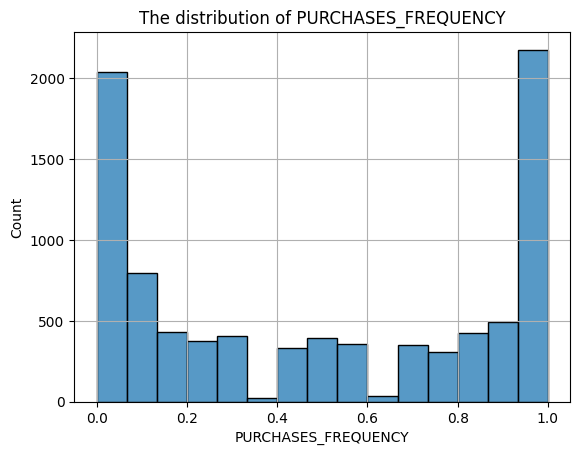

########## Summary Statistics of ONEOFF_PURCHASES_FREQUENCY ############
count    8950.000000
mean        0.202458
std         0.298336
min         0.000000
25%         0.000000
50%         0.083333
75%         0.300000
100%        1.000000
max         1.000000
Name: ONEOFF_PURCHASES_FREQUENCY, dtype: float64


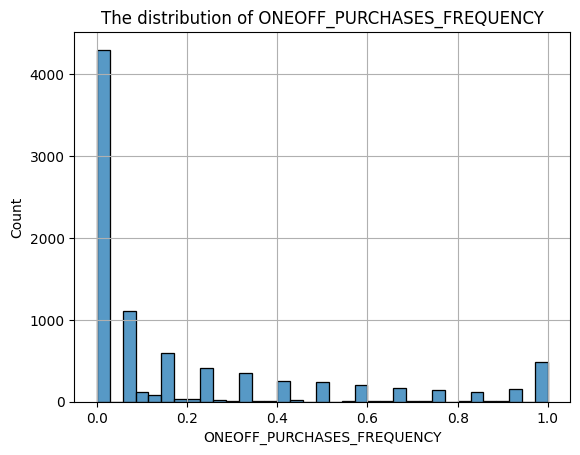

########## Summary Statistics of PURCHASES_INSTALLMENTS_FREQUENCY ############
count    8950.000000
mean        0.364437
std         0.397448
min         0.000000
25%         0.000000
50%         0.166667
75%         0.750000
100%        1.000000
max         1.000000
Name: PURCHASES_INSTALLMENTS_FREQUENCY, dtype: float64


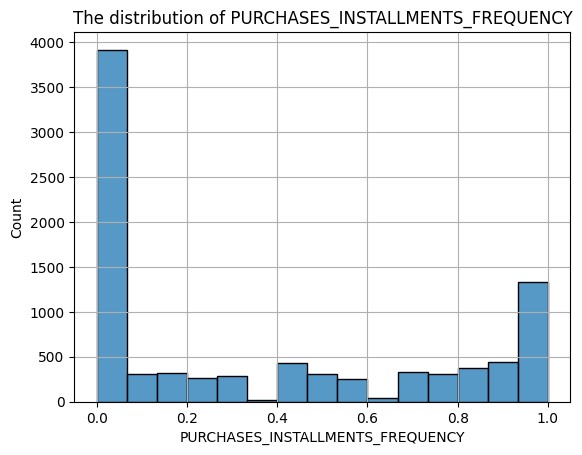

########## Summary Statistics of CASH_ADVANCE_FREQUENCY ############
count    8950.000000
mean        0.135144
std         0.200121
min         0.000000
25%         0.000000
50%         0.000000
75%         0.222222
100%        1.500000
max         1.500000
Name: CASH_ADVANCE_FREQUENCY, dtype: float64


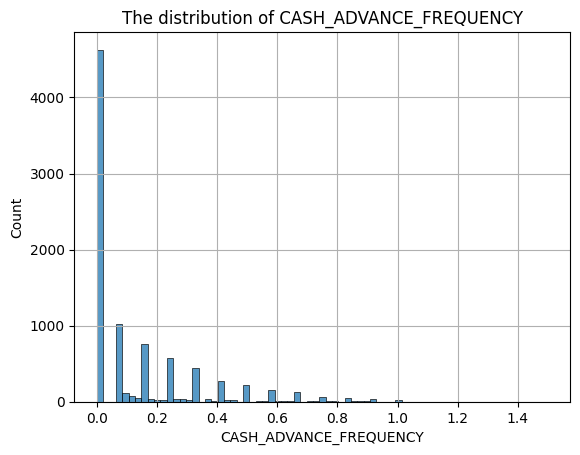

########## Summary Statistics of CASH_ADVANCE_TRX ############
count    8950.000000
mean        3.248827
std         6.824647
min         0.000000
25%         0.000000
50%         0.000000
75%         4.000000
100%      123.000000
max       123.000000
Name: CASH_ADVANCE_TRX, dtype: float64


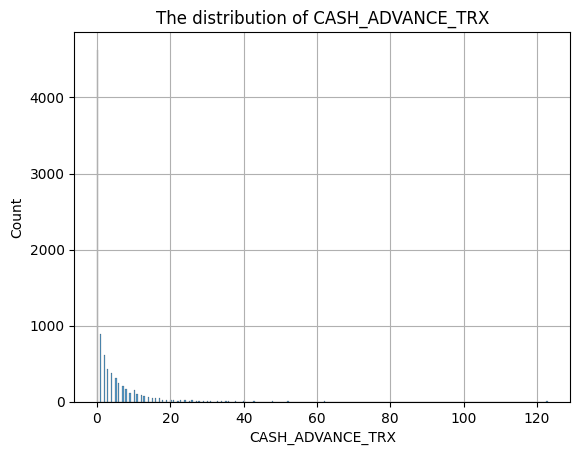

########## Summary Statistics of PURCHASES_TRX ############
count    8950.000000
mean       14.709832
std        24.857649
min         0.000000
25%         1.000000
50%         7.000000
75%        17.000000
100%      358.000000
max       358.000000
Name: PURCHASES_TRX, dtype: float64


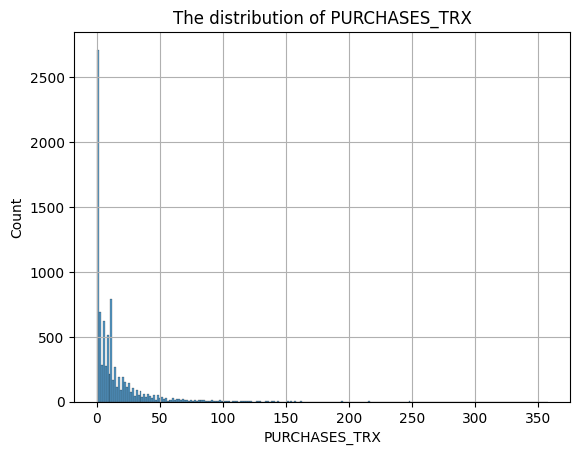

########## Summary Statistics of CREDIT_LIMIT ############
count     8949.000000
mean      4494.449450
std       3638.815725
min         50.000000
25%       1600.000000
50%       3000.000000
75%       6500.000000
100%     30000.000000
max      30000.000000
Name: CREDIT_LIMIT, dtype: float64


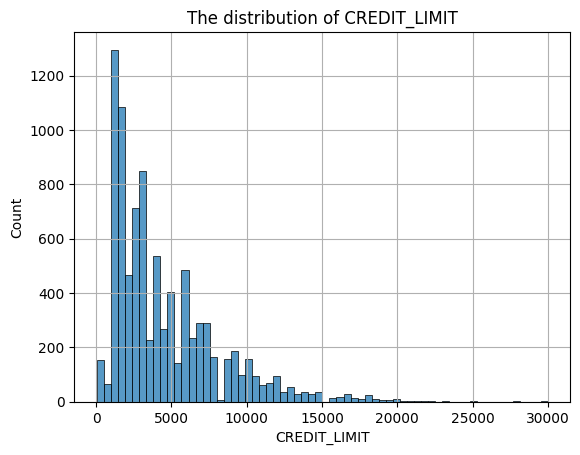

########## Summary Statistics of PAYMENTS ############
count     8950.000000
mean      1733.143852
std       2895.063757
min          0.000000
25%        383.276166
50%        856.901546
75%       1901.134317
100%     50721.483360
max      50721.483360
Name: PAYMENTS, dtype: float64


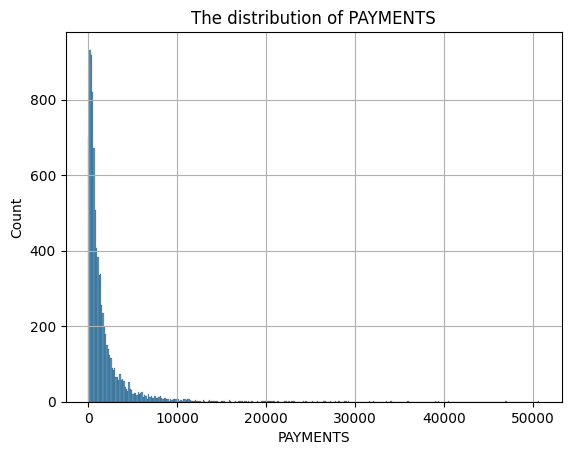

########## Summary Statistics of MINIMUM_PAYMENTS ############
count     8637.000000
mean       864.206542
std       2372.446607
min          0.019163
25%        169.123707
50%        312.343947
75%        825.485459
100%     76406.207520
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64


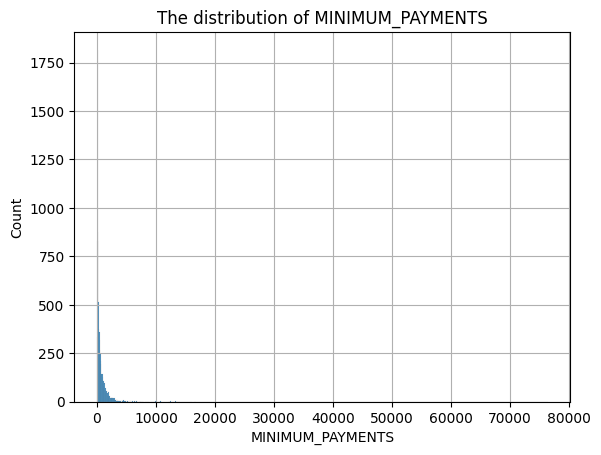

########## Summary Statistics of PRC_FULL_PAYMENT ############
count    8950.000000
mean        0.153715
std         0.292499
min         0.000000
25%         0.000000
50%         0.000000
75%         0.142857
100%        1.000000
max         1.000000
Name: PRC_FULL_PAYMENT, dtype: float64


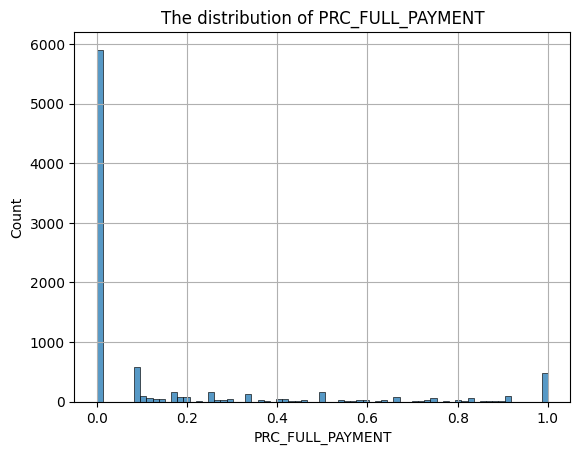

########## Summary Statistics of TENURE ############
count    8950.000000
mean       11.517318
std         1.338331
min         6.000000
25%        12.000000
50%        12.000000
75%        12.000000
100%       12.000000
max        12.000000
Name: TENURE, dtype: float64


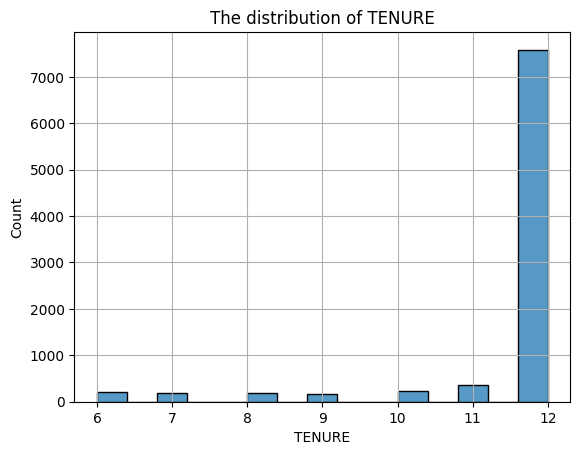

In [ ]:
num_summary(df, plot=True)

95% des utilisateurs ont une limite de crédit inférieure à 13 000 et un solde inférieur à 8 000.

Certaines caractéristiques comme 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE' montrent les mêmes tendances que le 'BALANCE' et  'CREDIT_LIMIT' .


'BALANCE_FREQUENCY' pour 86% des utilisateurs est mise à jour fréquemment.

Il y a deux groupes majoritaires de clients qui ont effectué des achats, à savoir ceux qui n'ont jamais ou rarement effectué d'achats et ceux qui en effectuent souvent.

Il y a plus d'utilisateurs qui ont payé par versements échelonnés plutôt qu'en une seule fois.

En raison de sa fréquence, il y a plus d'utilisateurs qui achètent par paiement échelonné que par paiement unique.

98% des utilisateurs effectuent des paiements échelonnés inférieurs à 12 000 euros, le montant minimum étant inférieur à 5 000 euros.

Seuls 5 % des utilisateurs environ ont complètement remboursé leur achat.

84% des utilisateurs utilisent toujours leur carte de crédit au cours du 12ème mois.

- **Analyse bivariée et multivariée**

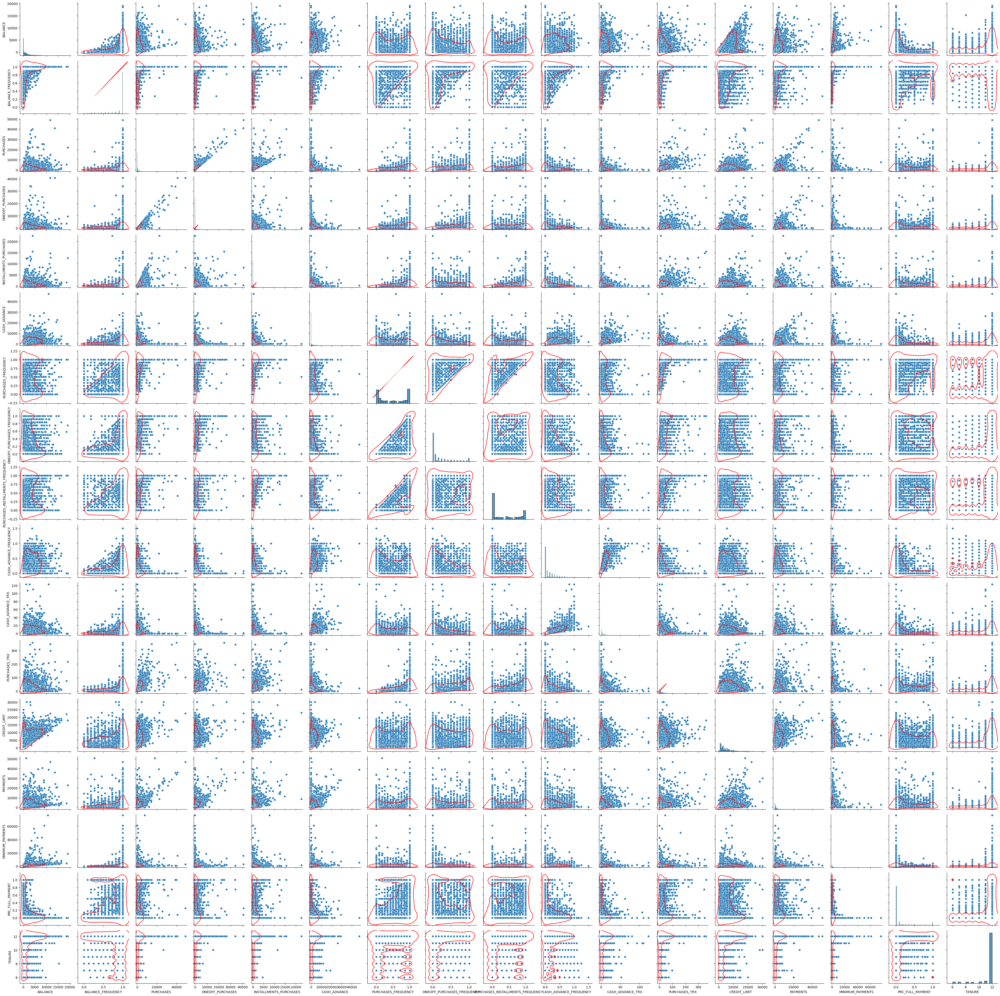

In [ ]:
# vue globale
g = sns.PairGrid(df.drop('CUST_ID', axis=1))
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.map(sns.kdeplot, levels=1, color='red');

confirme que  la plupart des utilisateurs se répartissent autour d'une limite de crédit inférieure à 13 000 et d'un solde inférieur à 8 000

Nous constatons que les caractéristiques telles que `purchases`, `oneoff_purchases`, `INSTALLMENT_purchases` et `cash_advance` affichent des tendances similaires à celles de la limite de crédit et du solde.

la plupart des utilisateurs se répartissent entre ceux qui ont effectué des paiements inférieurs à 12 000 et ceux qui ont effectué des paiements minimaux inférieurs à 5 000.


99% des utilisateurs ont un solde inférieur à 10.000 et la plupart d'entre eux (plus de 80%) :
- ont effectué des achats totaux jusqu'à 10 000
- ont effectué des achats ponctuels jusqu'à 5 000
- Achats à tempérament jusqu'à 5 000
- ont utilisé des liquidités en avance jusqu'à 10 000
- Ont une limite de crédit jusqu'à 15 000
- Paiement jusqu'à 10 000

La plupart des utilisateurs ont un solde inférieur ou égal à 10 000 euros et la moitié d'entre eux sont payés en une seule fois.


 99% des clients effectuent des achats jusqu'à 10 000 et :
- ont un solde inférieur ou égal à 10 000
- ont effectué des achats ponctuels jusqu'à 10 000
- ont effectué des achats à tempérament jusqu'à 5 000
- ont une limite de crédit jusqu'à 20 000
- Effectuer des paiements jusqu'à 20 000
- Utilisation de liquidités à l'avance jusqu'à 10 000

La plupart des utilisateurs qui ont effectué des achats jusqu'à 10 000 euros ont une limite de crédit jusqu'à 20 000 euros.


99% des clients ont une limite de crédit allant jusqu'à 20 000 et :
- ont effectué des achats à l'unité jusqu'à 5 000
- ont effectué des achats à tempérament jusqu'à 5 000
- ont effectué des paiements jusqu'à 10 000
- ont utilisé de l'argent liquide à l'avance jusqu'à 10 000

La plupart des clients ont déjà une limite de crédit élevée.

In [12]:
#displaying purchase frequency above 0.5
print(len(df[df['PURCHASES_INSTALLMENTS_FREQUENCY'] > .5]),'PURCHASES_INSTALLMENTS_FREQUENCY')
print(len(df[df['ONEOFF_PURCHASES_FREQUENCY'] > .5]), 'ONEOFF_PURCHASES_FREQUENCY')

3090 PURCHASES_INSTALLMENTS_FREQUENCY
1343 ONEOFF_PURCHASES_FREQUENCY


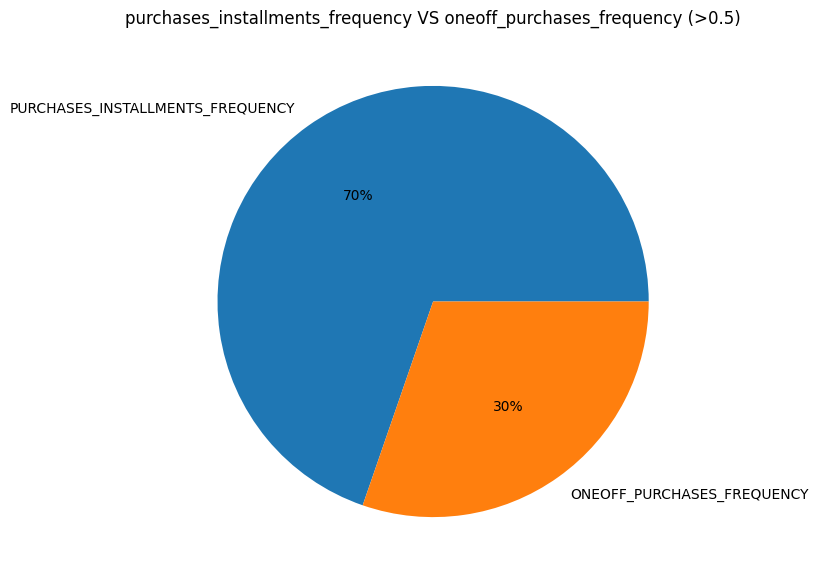

In [13]:
#pie plot for installment vs oneoff
plt.figure(figsize=(7,7))
plt.pie([len(df[df['PURCHASES_INSTALLMENTS_FREQUENCY'] > .5]),
         len(df[df['ONEOFF_PURCHASES_FREQUENCY'] > .5])],
        labels = ['PURCHASES_INSTALLMENTS_FREQUENCY',
                  'ONEOFF_PURCHASES_FREQUENCY'],
        autopct='%.0f%%')
plt.title('purchases_installments_frequency VS oneoff_purchases_frequency (>0.5)');

Le graphique ci-dessus montre que la plupart des utilisateurs ont effectué leurs achats en utilisant des paiements échelonnés plutôt qu'en une seule fois.

- **Correlations des  variables**

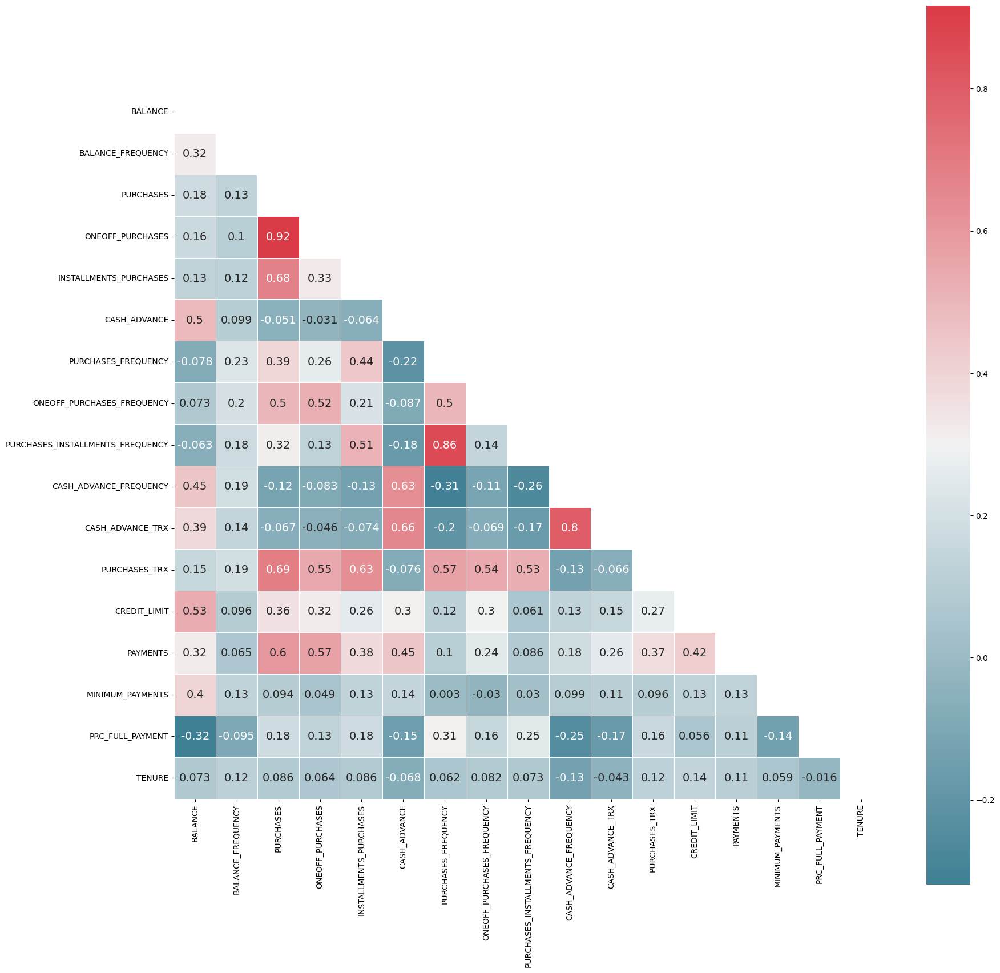

In [14]:
#Multivariate Analysis - Correlation Between Numerical Features
# calculates the correlations
correlation = df.corr(method='pearson')

# uses the variable ax for single a Axes
fig, ax = plt.subplots()

# sets the figure size in inches
ax.figure.set_size_inches(20, 20)

# generates a mask for the upper triangle
mask = np.triu(np.ones_like(correlation, dtype=np.bool))

# generates a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# plots the heatmap
sns.heatmap(correlation, cmap=cmap, mask=mask, square=True, linewidths=.5,
            annot=True, annot_kws={'size':14})

# displays the plot
plt.show()

Il Y a une forte correlation entre les variables
- ONEOFF_PURCHASES et PURCHASES.

- 'PURCHASES_INSTALLMENTS_FREQUENCY' et  'PURCHASES_FREQUENCY'.
- 'CASH_ADVANCE_FREQUENCY' et'CASH_ADVANCE_TRX'.

- 'PURCHASES' et 'PURCHASES_TRX',

-  **Detection des Outlier**:

In [15]:
def outlier_thresholds(dataframe, col_name, q1 = 0.25, q3 = 0.75):
    Q1 = dataframe[col_name].quantile(q1)
    Q3 = dataframe[col_name].quantile(q3)
    IQR = Q3 - Q1
    low_limit = Q1 - 1.5 * IQR
    up_limit = Q3 + 1.5 * IQR

    return low_limit, up_limit


In [16]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)

In [17]:
for col in num_cols:
    print(col,":",outlier_thresholds(df,col))

BALANCE : (-2760.5052645, 4942.9272155)
BALANCE_FREQUENCY : (0.7222225000000001, 1.1666664999999998)
PURCHASES : (-1566.1075000000003, 2715.8725000000004)
ONEOFF_PURCHASES : (-866.1075, 1443.5124999999998)
INSTALLMENTS_PURCHASES : (-702.95625, 1171.59375)
CASH_ADVANCE : (-1670.7317088750003, 2784.5528481250003)
PURCHASES_FREQUENCY : (-1.166668, 2.166668)
ONEOFF_PURCHASES_FREQUENCY : (-0.44999999999999996, 0.75)
PURCHASES_INSTALLMENTS_FREQUENCY : (-1.125, 1.875)
CASH_ADVANCE_FREQUENCY : (-0.333333, 0.555555)
CASH_ADVANCE_TRX : (-6.0, 10.0)
PURCHASES_TRX : (-23.0, 41.0)
CREDIT_LIMIT : (-5750.0, 13850.0)
PAYMENTS : (-1893.5110601250003, 4177.921542875)
MINIMUM_PAYMENTS : (-815.4189210000001, 1810.0280870000001)
PRC_FULL_PAYMENT : (-0.21428550000000002, 0.35714250000000003)
TENURE : (12.0, 12.0)


In [ ]:
# Showing Outliers with Boxplot:

def check_outlier(dataframe, q1=0.25, q3=0.75):
    for col_name in num_cols:
        low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
        if dataframe[(dataframe[col_name] < low_limit) | (dataframe[col_name] > up_limit)].any(axis=None):
            sns.boxplot(x=dataframe[col_name])
            plt.show()
        else:
            return False

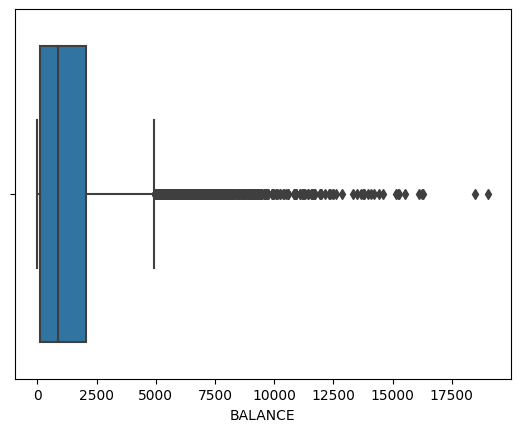

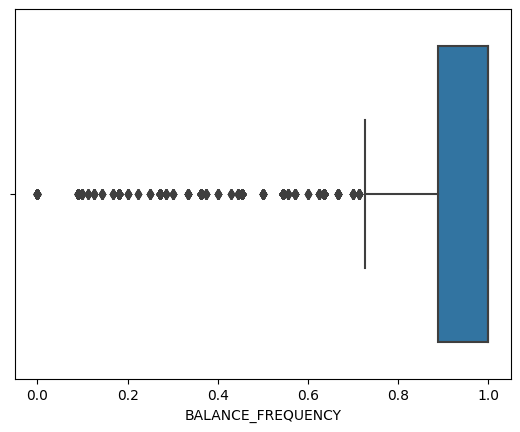

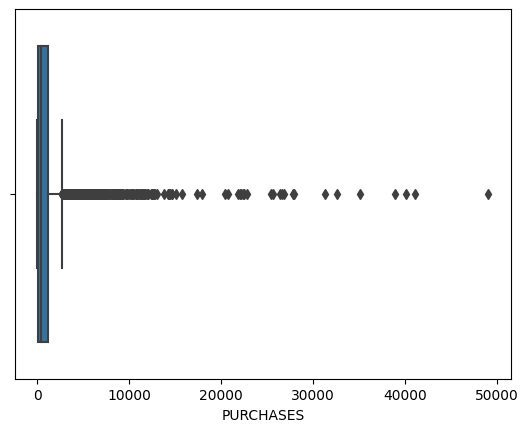

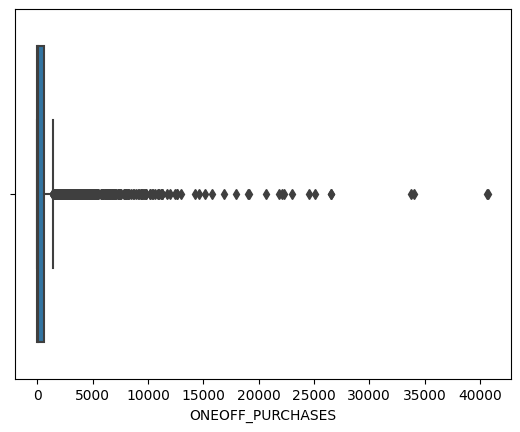

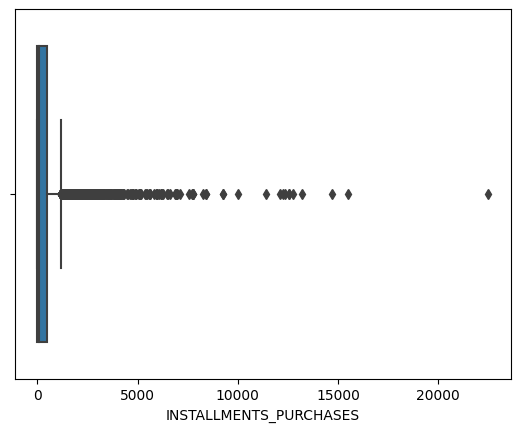

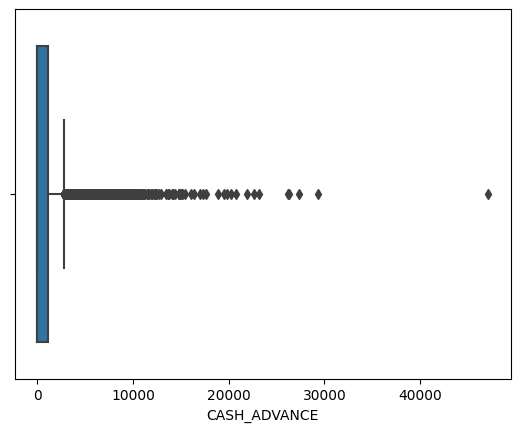

False

In [ ]:
check_outlier(df)

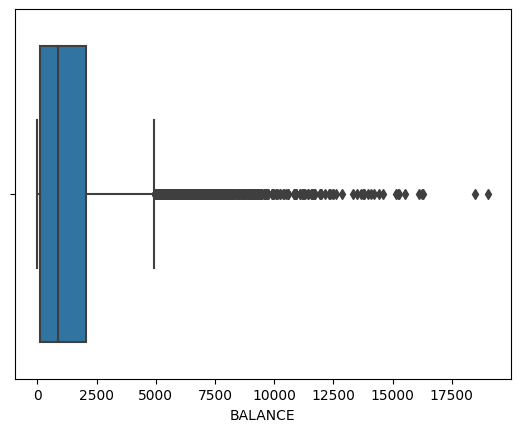

False

In [ ]:
check_outlier(df, q1=0.05, q3=0.95)

In [18]:
#let us numerically draw conclusions
#creating function that can calculate interquartile range of the data
def calc_interquartile(data, column):
    global lower, upper
    #calculating the first and third quartile
    first_quartile, third_quartile = np.percentile(data[column], 25), np.percentile(data[column], 75)
    #calculate the interquartilerange
    iqr = third_quartile - first_quartile
    # outlier cutoff (1.5 is a generally taken as a threshold thats why i am also taking it)
    cutoff = iqr*1.5
    #calculate the lower and upper limits
    lower, upper = first_quartile - cutoff , third_quartile + cutoff
    #remove the outliers from the columns
    upper_outliers = data[data[column] > upper]
    lower_outliers = data[data[column] < lower]
    print('Lower outliers', lower_outliers.shape[0])
    print('Upper outliers', upper_outliers.shape[0])
    return print('total outliers', upper_outliers.shape[0] + lower_outliers.shape[0])


Total outliers in  BALANCE
Lower outliers 0
Upper outliers 695
total outliers 695
4942.9272155 -2760.5052645


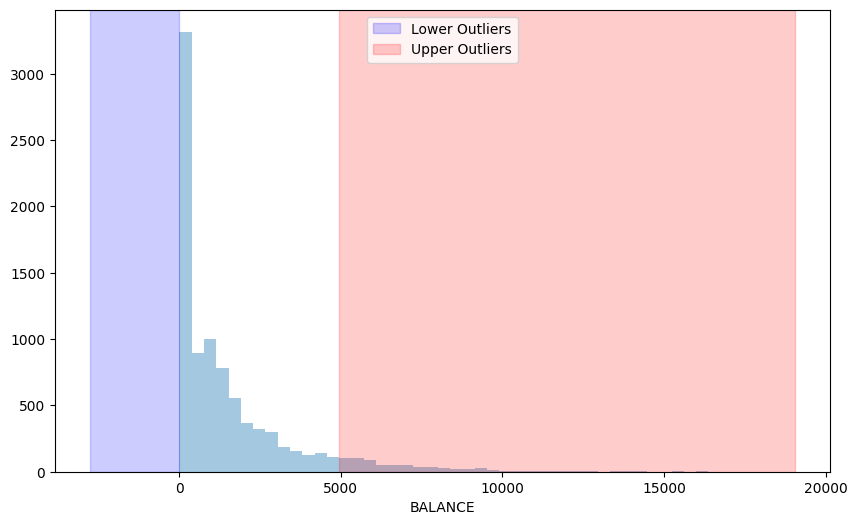

Total outliers in  BALANCE_FREQUENCY
Lower outliers 1493
Upper outliers 0
total outliers 1493
1.1666664999999998 0.7222225000000001


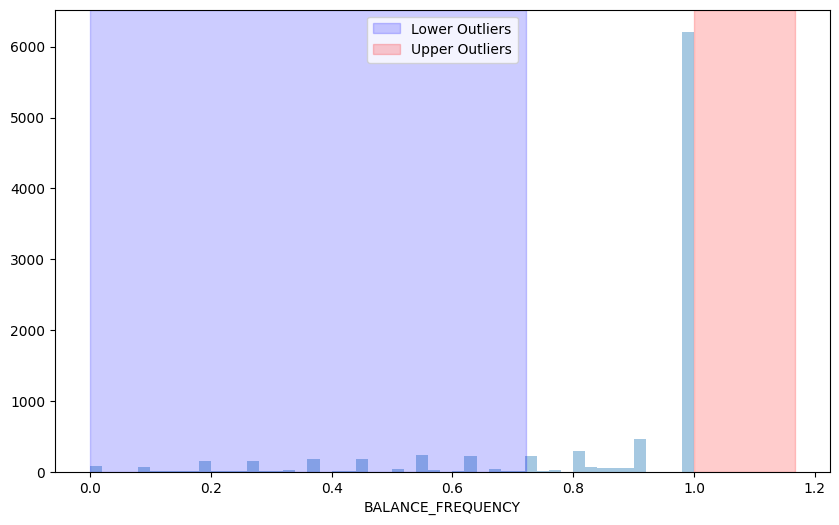

Total outliers in  PURCHASES
Lower outliers 0
Upper outliers 808
total outliers 808
2715.8725000000004 -1566.1075000000003


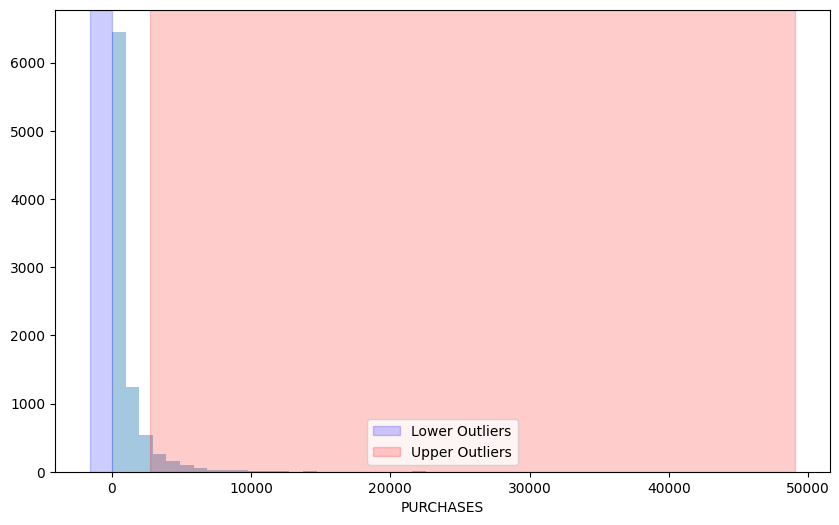

Total outliers in  ONEOFF_PURCHASES
Lower outliers 0
Upper outliers 1013
total outliers 1013
1443.5124999999998 -866.1075


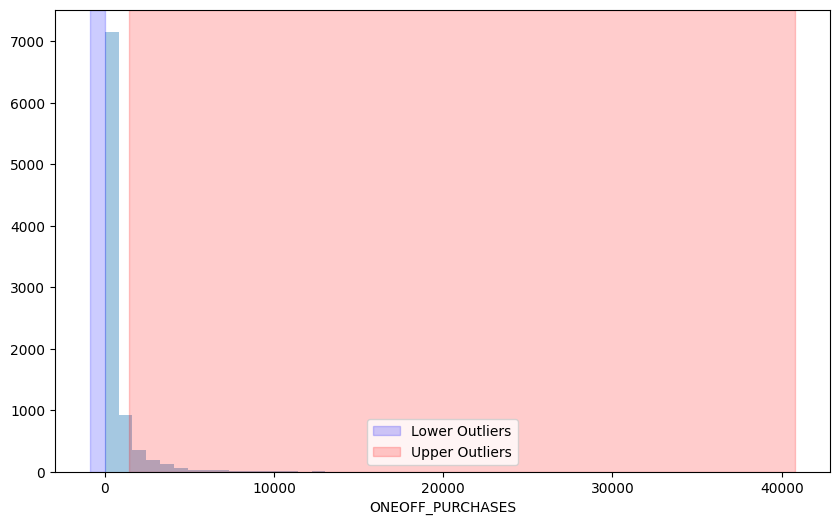

Total outliers in  INSTALLMENTS_PURCHASES
Lower outliers 0
Upper outliers 867
total outliers 867
1171.59375 -702.95625


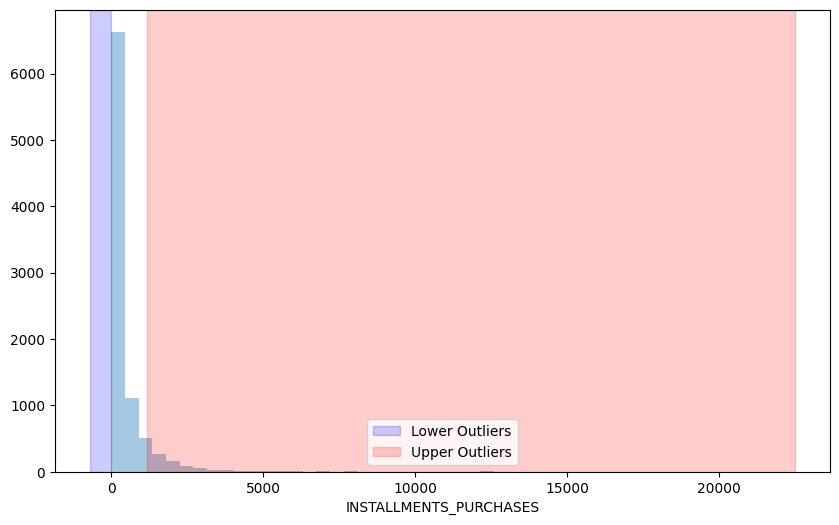

Total outliers in  CASH_ADVANCE
Lower outliers 0
Upper outliers 1030
total outliers 1030
2784.5528481250003 -1670.7317088750003


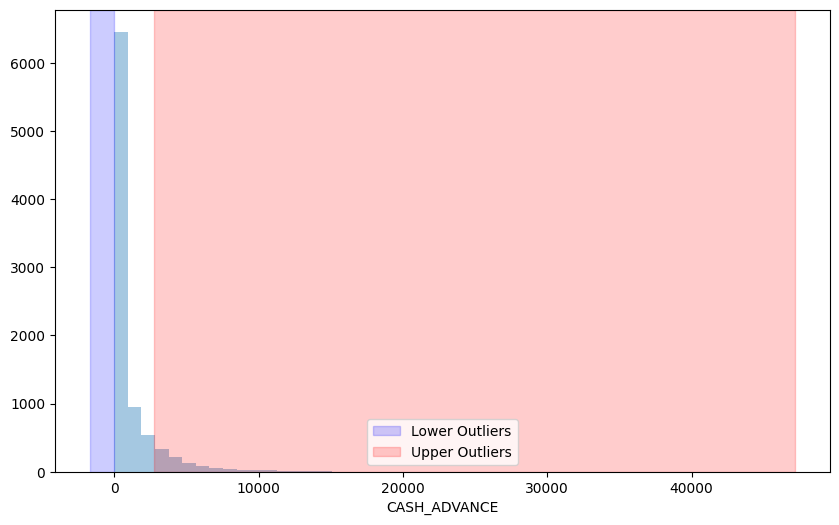

Total outliers in  PURCHASES_FREQUENCY
Lower outliers 0
Upper outliers 0
total outliers 0
2.166668 -1.166668


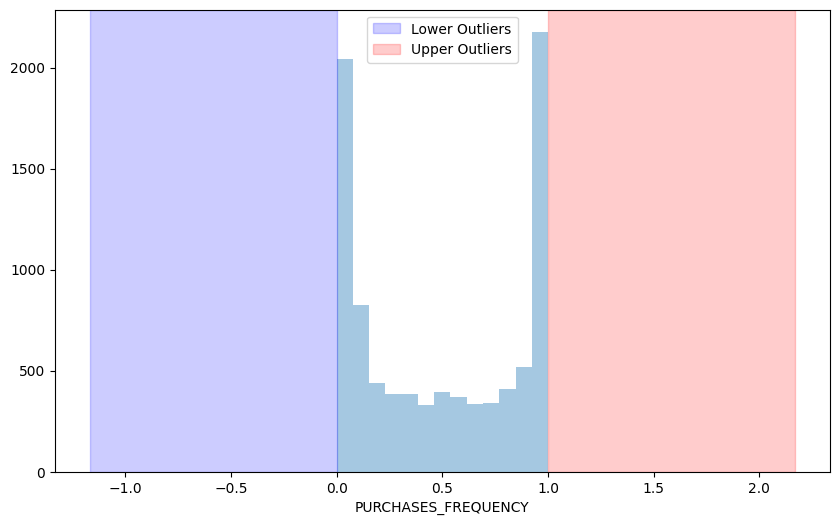

Total outliers in  ONEOFF_PURCHASES_FREQUENCY
Lower outliers 0
Upper outliers 782
total outliers 782
0.75 -0.44999999999999996


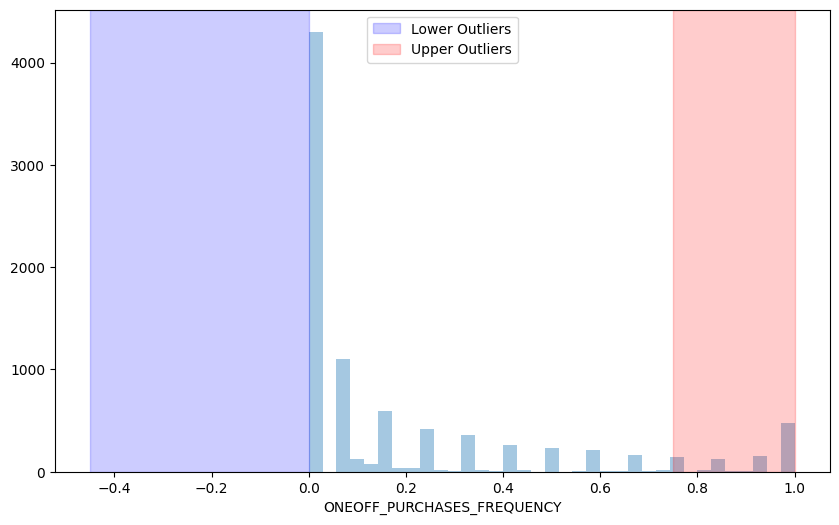

Total outliers in  PURCHASES_INSTALLMENTS_FREQUENCY
Lower outliers 0
Upper outliers 0
total outliers 0
1.875 -1.125


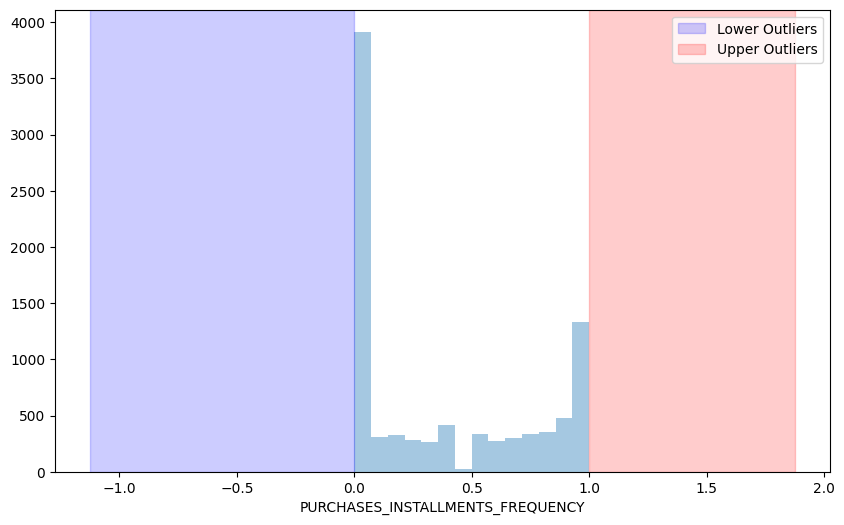

Total outliers in  CASH_ADVANCE_FREQUENCY
Lower outliers 0
Upper outliers 525
total outliers 525
0.555555 -0.333333


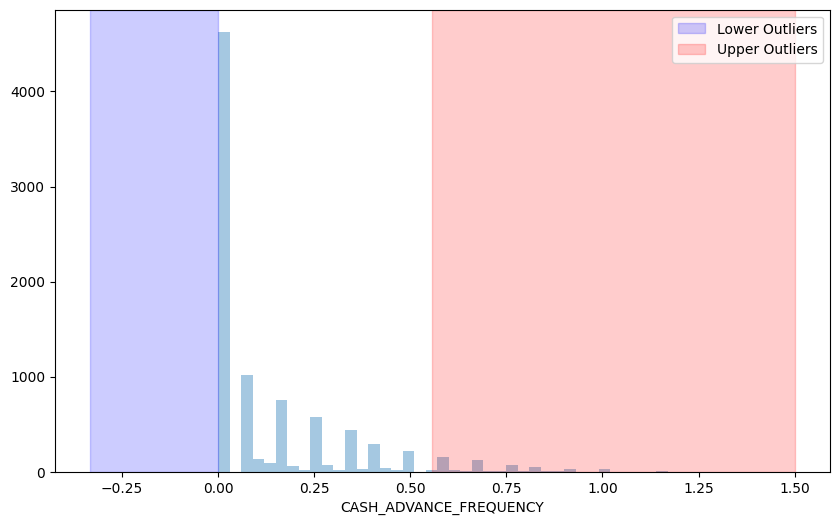

Total outliers in  CASH_ADVANCE_TRX
Lower outliers 0
Upper outliers 804
total outliers 804
10.0 -6.0


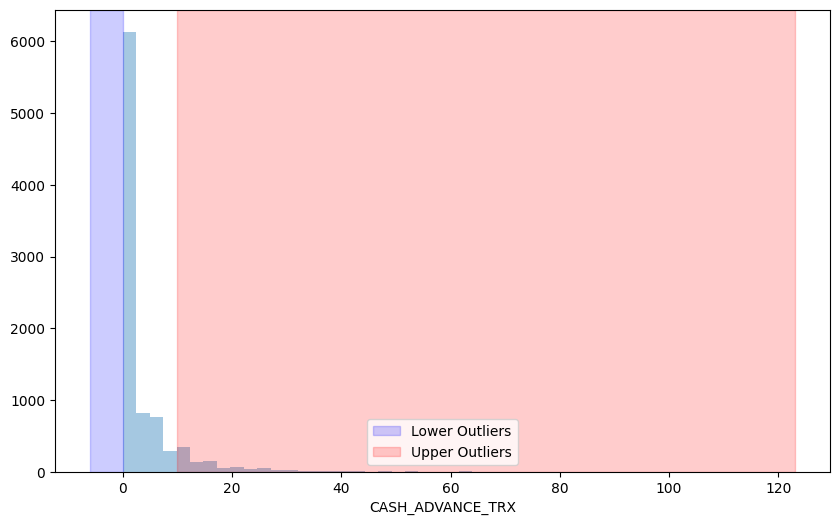

Total outliers in  PURCHASES_TRX
Lower outliers 0
Upper outliers 766
total outliers 766
41.0 -23.0


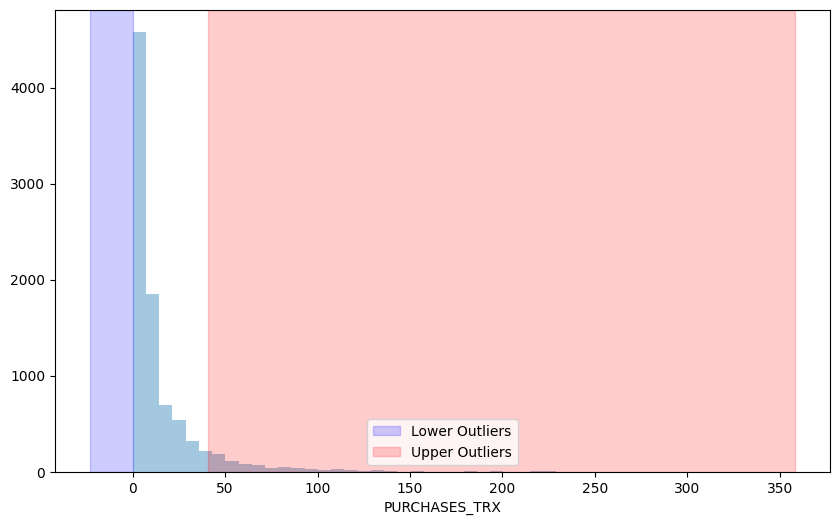

Total outliers in  CREDIT_LIMIT
Lower outliers 0
Upper outliers 0
total outliers 0
nan nan


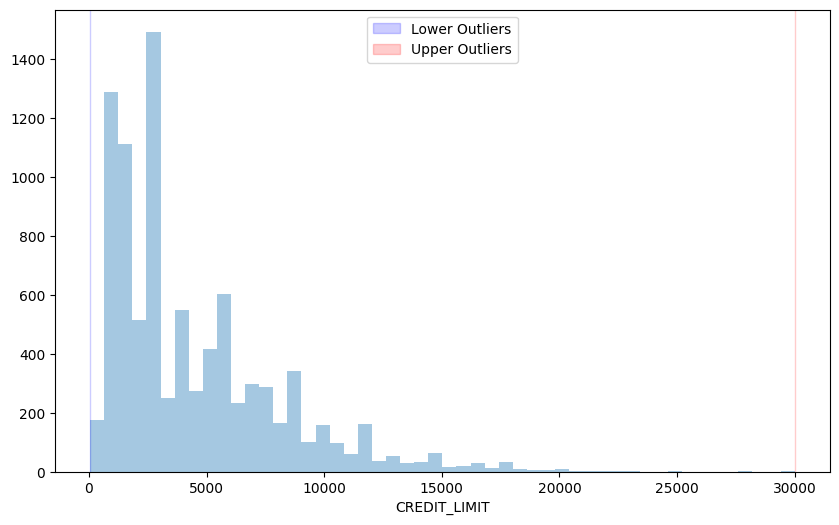

Total outliers in  PAYMENTS
Lower outliers 0
Upper outliers 808
total outliers 808
4177.921542875 -1893.5110601250003


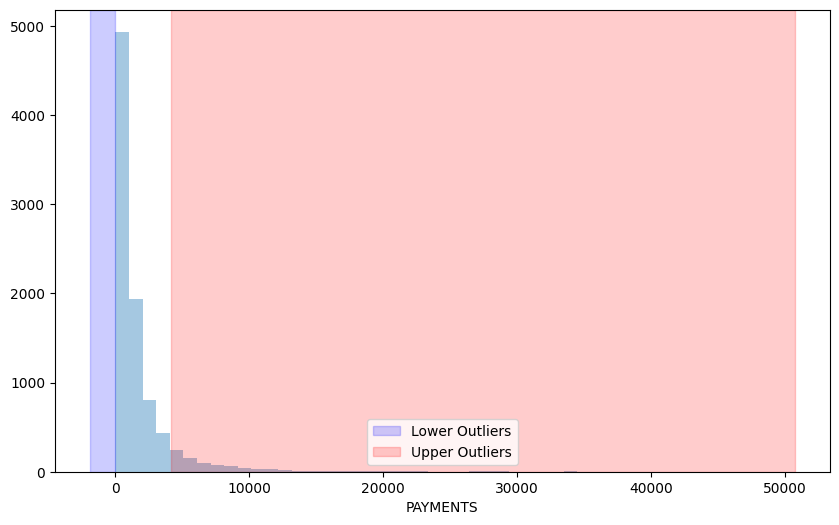

Total outliers in  MINIMUM_PAYMENTS
Lower outliers 0
Upper outliers 0
total outliers 0
nan nan


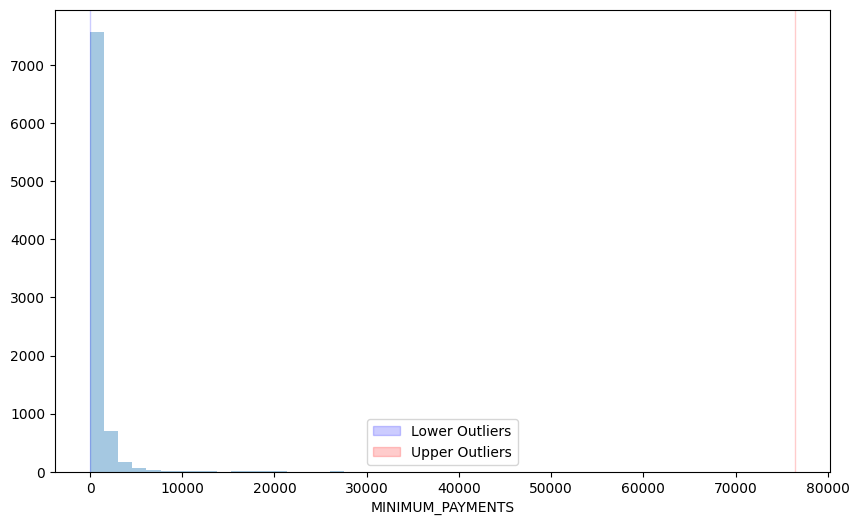

Total outliers in  PRC_FULL_PAYMENT
Lower outliers 0
Upper outliers 1474
total outliers 1474
0.35714250000000003 -0.21428550000000002


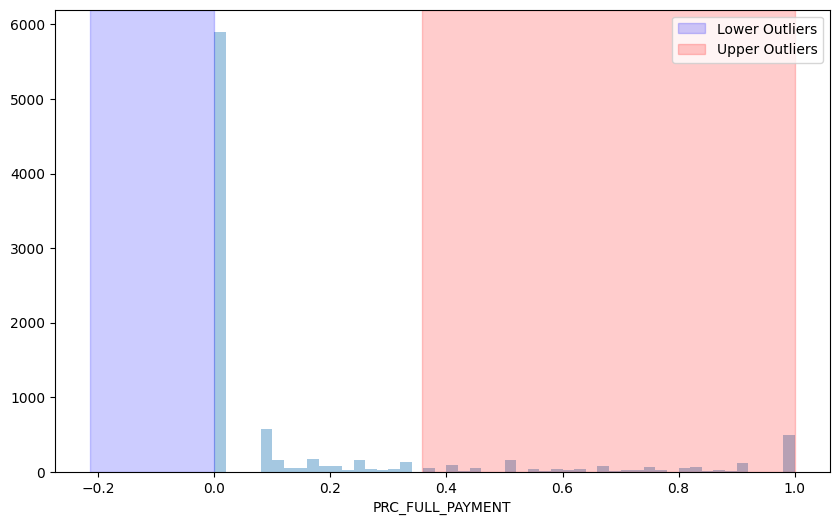

Total outliers in  TENURE
Lower outliers 1366
Upper outliers 0
total outliers 1366
12.0 12.0


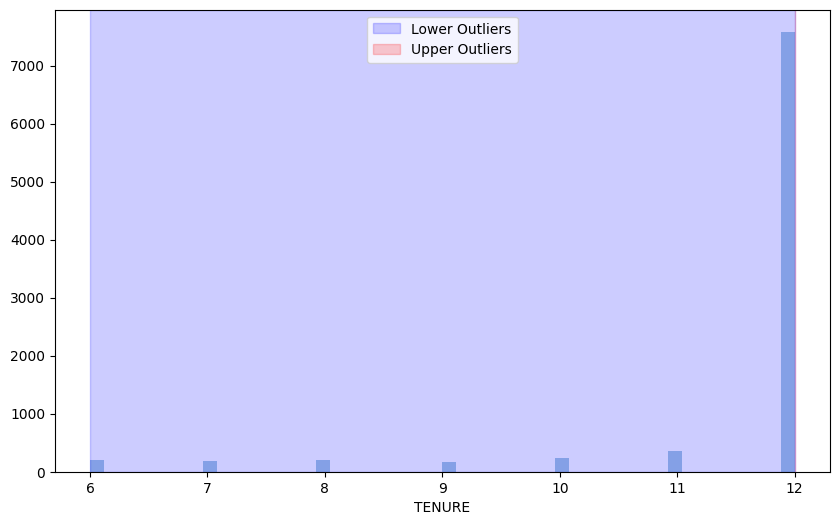

In [19]:
#plotting outliers graph for each feature
#for  col in df.select_dtypes('float'):
for  col in num_cols:
  print('Total outliers in ', col)
  calc_interquartile(df, col)
  plt.figure(figsize = (10,6))
  sns.distplot(df[col], kde=False)
  print(upper, lower)
  plt.axvspan(xmin = lower,xmax= df[col].min(),alpha=0.2, color='blue', label='Lower Outliers')
  plt.axvspan(xmin = upper,xmax= df[col].max(),alpha=0.2, color='red', label='Upper Outliers')
  plt.legend()
  plt.show()

Nous constatons que la majeur partie des variables ont des valeurs aberrantes. Mais nous n'allons pas supprimer ces valeurs aberrantes, car il est possible que toutes ces valeurs soient présentes sur le terrain. En plus l'objectif  ici c'est de définir des groupes au sein des données elles-mêmes.

-  **Detection des Anomaliies**:

In [20]:
#Anomaly 1
df[df['BALANCE'] > df['CREDIT_LIMIT']]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5,C10006,1809.828751,1.0,1333.28,0.0,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
10,C10011,1293.124939,1.0,920.12,0.0,920.12,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1200.0,1083.301007,2172.697765,0.000000,12
20,C10021,2016.684686,1.0,176.68,0.0,176.68,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,2000.0,223.068600,13557.297260,0.000000,12
64,C10067,1923.886805,1.0,1887.64,0.0,1887.64,1605.949371,1.000000,0.000000,1.000000,0.083333,4,61,1850.0,3688.045998,3266.996777,0.083333,12
78,C10082,1205.716678,1.0,0.00,0.0,0.00,38.325801,0.000000,0.000000,0.000000,0.083333,1,0,1200.0,29.278671,8242.687678,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8589,C18823,1283.337407,1.0,1022.41,171.6,850.81,1158.035224,0.875000,0.125000,0.750000,0.250000,5,16,1200.0,846.998942,1838.410150,0.000000,8
8614,C18848,1182.080141,1.0,266.68,0.0,266.68,848.848179,0.666667,0.000000,0.666667,0.083333,6,8,1000.0,119.861878,8607.234543,0.000000,12
8624,C18858,1012.089680,1.0,312.48,0.0,312.48,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1000.0,325.606238,607.957480,0.000000,12
8724,C18961,3002.791004,1.0,2463.00,2463.0,0.00,797.158950,0.166667,0.166667,0.000000,0.166667,3,3,3000.0,431.716492,16638.733850,0.000000,12


In [21]:
# Anomaly 2
df[df['MINIMUM_PAYMENTS'] > df['PAYMENTS']]


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.00,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.00,12
10,C10011,1293.124939,1.000000,920.12,0.00,920.12,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1200.0,1083.301007,2172.697765,0.00,12
14,C10015,2772.772734,1.000000,0.00,0.00,0.00,346.811390,0.000000,0.000000,0.000000,0.083333,1,0,3000.0,805.647974,989.962866,0.00,12
15,C10016,6886.213231,1.000000,1611.70,0.00,1611.70,2301.491267,0.500000,0.000000,0.500000,0.166667,4,11,8000.0,1993.439277,2109.906490,0.00,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8933,C19174,735.652303,1.000000,619.60,255.62,363.98,546.902403,1.000000,0.166667,0.833333,0.166667,5,16,1000.0,106.138603,337.294767,0.00,6
8939,C19180,728.352548,1.000000,734.40,734.40,0.00,239.891038,0.333333,0.333333,0.000000,0.166667,2,2,1000.0,72.530037,110.950798,0.00,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.25,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6


In [ ]:
# Anomaly 3
df[df['INSTALLMENTS_PURCHASES'] > df['CREDIT_LIMIT']]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
64,1923.886805,1.000000,1887.64,0.00,1887.64,1605.949371,1.000000,0.000000,1.000000,0.083333,4,61,1850.0,3688.045998,3266.996777,0.083333,12
180,903.297810,1.000000,2697.48,150.50,2546.98,0.000000,1.000000,0.333333,1.000000,0.000000,0,39,2500.0,1686.196344,303.361632,0.000000,12
185,168.522709,0.818182,2009.05,0.00,2009.05,0.000000,0.833333,0.000000,0.750000,0.000000,0,22,1200.0,2612.760497,197.638558,0.142857,12
231,279.608696,1.000000,3034.92,0.00,3034.92,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2900.0,2928.909865,2733.317012,0.083333,12
295,635.090434,0.818182,5758.71,2252.37,3506.34,0.000000,0.750000,0.250000,0.750000,0.000000,0,48,2900.0,7943.570210,197.416104,1.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8788,133.099445,1.000000,1170.00,0.00,1170.00,0.000000,1.000000,0.000000,0.900000,0.000000,0,12,1000.0,1068.502534,161.816503,0.444444,10
8836,112.037368,1.000000,1006.69,0.00,1006.69,0.000000,1.000000,0.000000,0.888889,0.000000,0,11,1000.0,1000.036596,123.408318,1.000000,9
8837,272.624436,0.888889,1843.00,470.00,1373.00,0.000000,0.666667,0.111111,0.444444,0.000000,0,6,1000.0,1477.357626,140.980969,0.400000,9
8856,227.220411,1.000000,1387.60,288.54,1099.06,107.660394,1.000000,0.875000,0.875000,0.125000,1,71,1000.0,1217.473837,136.283049,0.142857,8


In [22]:
# Anomaly 4
df[df['CASH_ADVANCE_FREQUENCY'] > 1]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
681,C10708,5656.069801,1.000000,362.36,362.36,0.0,7240.433194,0.250000,0.250000,0.0,1.250000,12,2,8000.0,683.421497,2036.877611,0.0,8
1626,C11680,2876.009336,1.000000,152.61,152.61,0.0,3719.650168,0.333333,0.333333,0.0,1.166667,24,2,4000.0,248.342971,584.926336,0.0,6
2555,C12629,5906.184924,1.000000,141.80,141.80,0.0,1651.286918,0.125000,0.125000,0.0,1.125000,12,2,10000.0,933.969974,919.289675,0.0,8
2608,C12684,7801.511533,1.000000,231.40,231.40,0.0,4109.465221,0.100000,0.100000,0.0,1.100000,20,3,13500.0,1593.617739,1522.496755,0.0,10
3038,C13127,3846.742530,1.000000,0.00,0.00,0.0,1932.460679,0.000000,0.000000,0.0,1.500000,18,0,5600.0,496.245836,538.346874,0.0,6
3253,C13347,5709.486507,0.833333,0.00,0.00,0.0,2794.326341,0.000000,0.000000,0.0,1.166667,10,0,6000.0,550.513331,1299.463370,0.0,6
8055,C18273,1917.895730,1.000000,285.07,285.07,0.0,6084.858872,0.363636,0.363636,0.0,1.090909,28,6,3000.0,5692.682993,556.449635,0.0,11
8365,C18588,3857.562230,1.000000,0.00,0.00,0.0,2127.213754,0.000000,0.000000,0.0,1.142857,26,0,5000.0,617.508991,538.396872,0.0,7


Divers raisons peuvent expliquer cette anomalie parmi lesquelles:
- la non mise à jours du paiement minimum  par le système.


### 1.2 **Pre-processing**

- **Suppression de colonnes inutiles**

In [23]:
df.drop(columns=["CUST_ID"], axis=1, inplace=True)

- **Traitement des données manquantes**

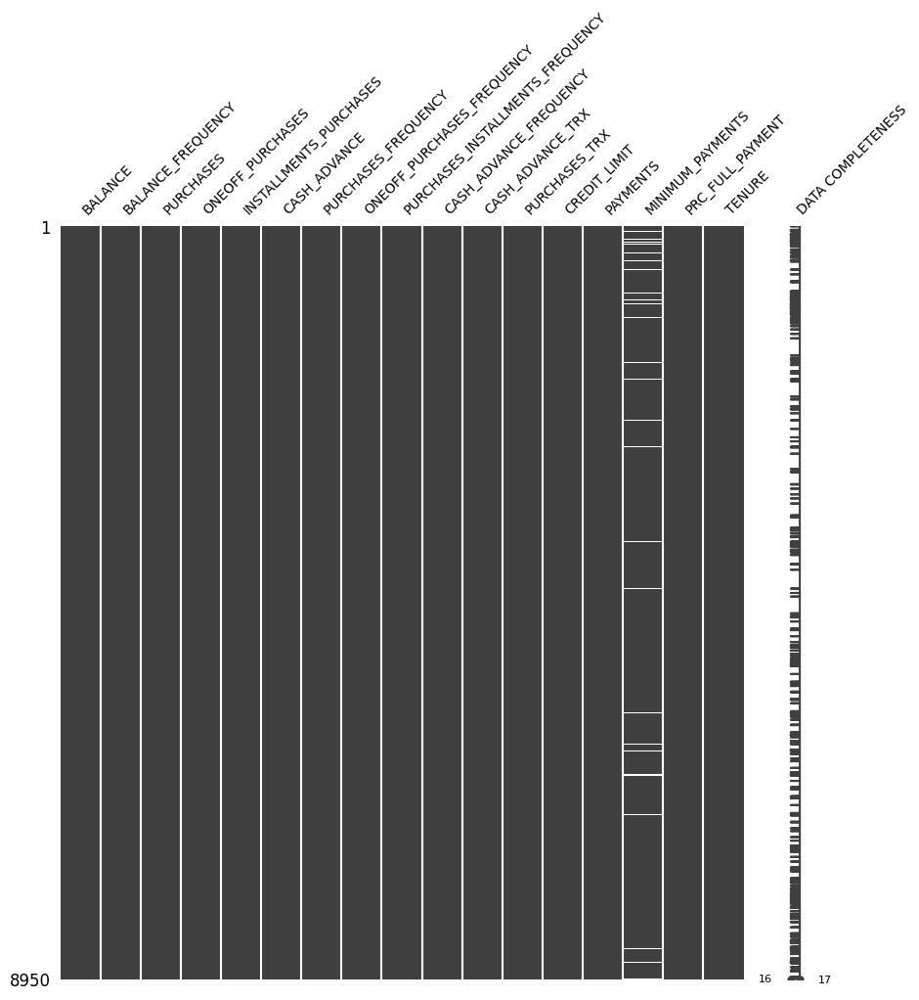

In [24]:
# La matrice de nullité msno.matrix est un affichage dense en données
#qui  permet de repérer rapidement et visuellement des modèles dans l'achèvement des données.
msno.matrix(df, figsize=(10,10), fontsize=10, labels=8)
plt.show()

<Axes: >

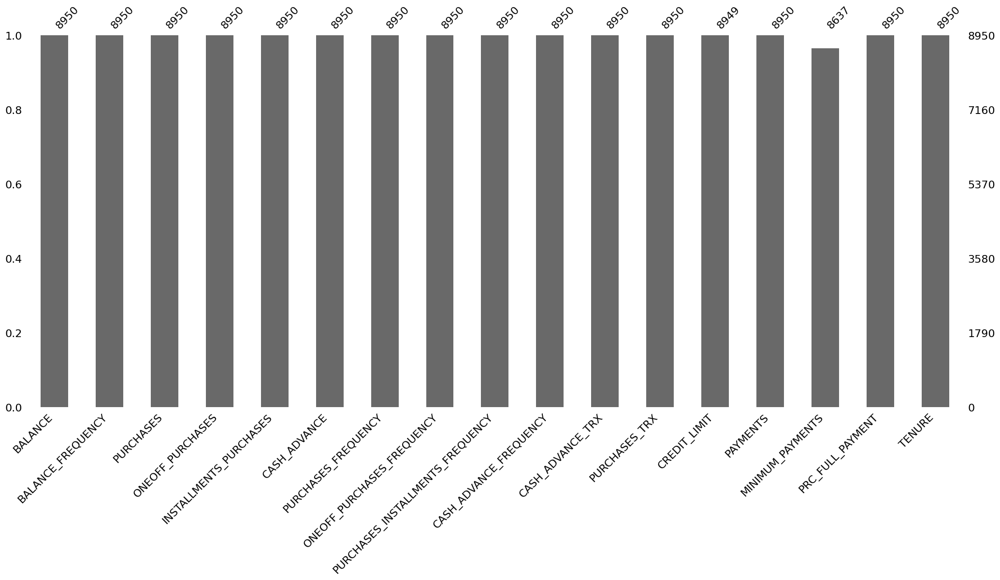

In [ ]:
# Visualize the number of missing
# values as a bar chart
# msno.bar est une simple visualisation de la nullité par colonne
msno.bar(df)

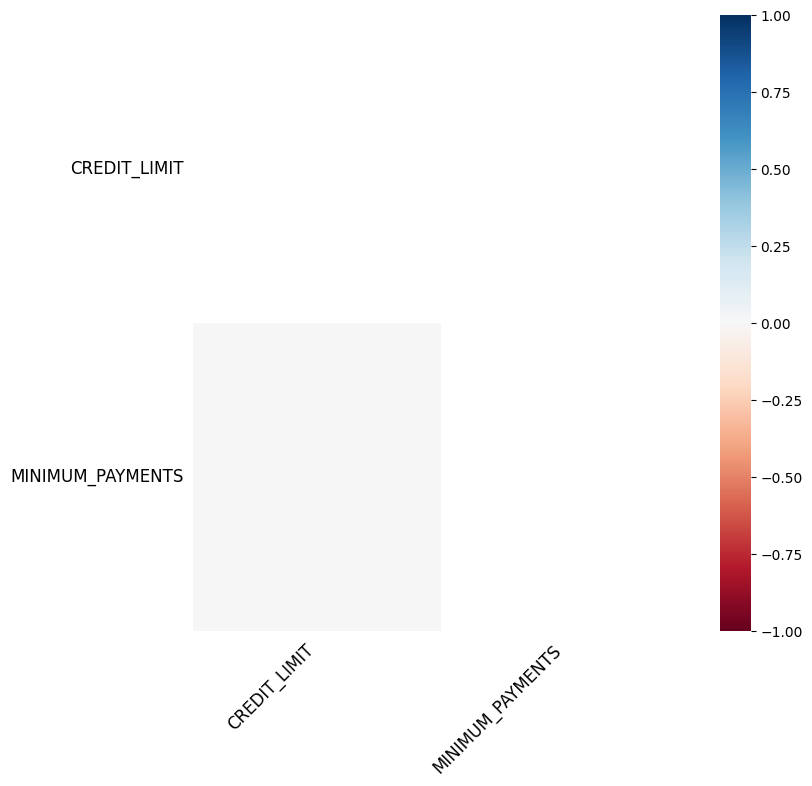

In [ ]:
#msno.heatmap mesure la corrélation de nullité : l'influence de la présence ou de l'absence d'une variable sur la présence d'une autre variable.
msno.heatmap(df, figsize=(8,8), fontsize=12)
plt.show()



Pour la variable 'CREDIT_LIMIT' qui ne comporte qu'une seule valeur manquante, Donc peut etre remplacer la moyenne puisque cette variable ne comporte pas des outliers.

In [25]:
df.CREDIT_LIMIT = df.CREDIT_LIMIT.fillna(df.CREDIT_LIMIT.mean())

La variable MINIMUM_PAYMENTS a 313 valeurs manquantes. En plus cette variable a des outliers donc ces données manquantes  doivent être traitées spécifiquement.

In [26]:
#Treating MINIMUM_PAYMENTS missing values
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
3,0.000000,NaN
45,0.000000,NaN
47,0.000000,NaN
54,417.016763,NaN
55,0.000000,NaN
...,...,...
8919,0.000000,NaN
8929,0.000000,NaN
8935,0.000000,NaN
8944,0.000000,NaN


Il est évident que les clients qui n'ont effectué aucun paiement n'ont pas non plus de paiements minimums
Par conséquent, si PAIEMENTS = 0 alors PAIEMENTS_MINIMUM = 0

Reglons d'abord ces cas.

In [27]:
#Treating MINIMUM_PAYMENTS missing values
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()][df['PAYMENTS']== 0]

,PAYMENTS,MINIMUM_PAYMENTS
3,0.0,NaN
45,0.0,NaN
47,0.0,NaN
55,0.0,NaN
56,0.0,NaN
...,...,...
8854,0.0,NaN
8919,0.0,NaN
8929,0.0,NaN
8935,0.0,NaN


240 données manquantes  de 'MINIMUM_PAYMENTS' doivent etre à zeros.




In [28]:
minpay = df['MINIMUM_PAYMENTS'].copy() # make a copy of MINIMUM_PAYMENTS
i = 0
for payments, minpayments in zip(df['PAYMENTS'], df['MINIMUM_PAYMENTS'].isna()):
    if (payments == 0) and (minpayments == True):
        minpay[i] = 0
    i += 1

df['MINIMUM_PAYMENTS'] = minpay.copy()

In [29]:
#Treating MINIMUM_PAYMENTS missing values
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
54,417.016763,NaN
99,138.021428,NaN
146,746.691026,NaN
319,1159.135064,NaN
1155,29272.486070,NaN
...,...,...
8561,295.937124,NaN
8593,3905.430817,NaN
8647,5.070726,NaN
8753,578.819329,NaN


Il reste 73/313 données manquantes à traiter.

existance de outliers donc ont utilise la mediane pour la completion des données manquantes

In [30]:
df.MINIMUM_PAYMENTS  = df.MINIMUM_PAYMENTS.fillna(df.MINIMUM_PAYMENTS.median())

In [31]:
#Treating MINIMUM_PAYMENTS missing values
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS


In [32]:
# Final check of missing values presence:

df.isna().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

- **Traitement des outliers**

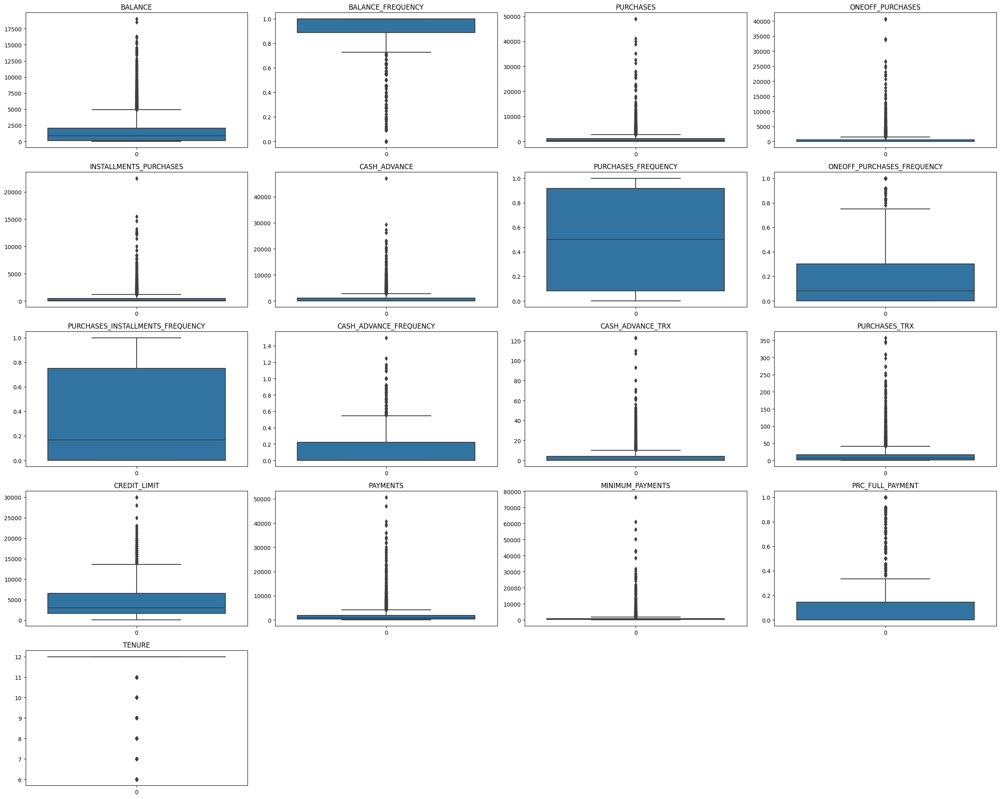

In [ ]:
# plot for outliers detection

plt.figure(figsize=(25,20))
for i in range(len(df.columns)):
    plt.subplot(5,4,i+1)
    sns.boxplot(df[df.columns[i]])
    plt.title(df.columns[i])

plt.tight_layout()

Il y a un nombre très élevé d'outliers. En plus les valeurs aberrantes sont principalement dues à la nature de l'ensemble de données. Par conséquent  nous décidons de ne pas les supprimer. D'esseyer des méthodes qui s'adapter correctement à cet ensemble de données.



 - **Traitement des anomalies**

Étant donné que les fréquences des avances en espèces supérieures à 1 sont inférieures à 1 %, nous décidons de passer à 1, en supposant que ce changement n'aura pas d'incidence sur la distribution des données.

In [33]:
# change cash_advance_frequency above 1 to 1
cash_advance_freq_more_than_1 = df[df['CASH_ADVANCE_FREQUENCY'] > 1].index
df['CASH_ADVANCE_FREQUENCY'].iloc[cash_advance_freq_more_than_1] = 1

#check whether there is still cash_advance_frequency above 1
df[df['CASH_ADVANCE_FREQUENCY'] > 1].CASH_ADVANCE_FREQUENCY.any()

False

- **Selection de variables**

Étant donné que notre objectif dans ce projet est le regroupement (segmentation de la clientèle) et que nous ne traitons le regroupement qu'à l'aide d'une caractéristique liée au comportement de la clientèle, nous avons décidé d'abandonner plusieurs caractéristiques.

- Les variables 'MINIMUM_PAYMENTS','TENURE, 'CREDIT_LIMIT', 'BALANCE'  ne modifient pas le comportement des clients.

- 'PURCHASES' : cette caractéristique est déjà expliquée par les variables 'ONEOFF_PURCHASES' et 'INSTALLMENTS_PURCHASES'.

- 'CASH_ADVANCE' :  Cette caractéristique est représentée par 'CASH_ADVANCE_FREQUENCY'.

- 'CASH_ADVANCE_TRX' : cette caractéristique indique le nombre  de l'avance de fonds effectuée. Elle est représentée par 'CASH_ADVANCE_FREQUENCY'.

-'PURCHASES_TRX': cette caractéristique indique le nombre de l'achat effectué. Elle est représentée par 'PURCHASES_FREQUENCY'.

-'PAYMENTS' : cette fonction indique le montant des paiements effectués et déjà représenté par les proportions des paiements.


In [34]:
# creating new variable for modeling
df_model = df.copy()

In [35]:
# droppping unused feature
df_model.drop(['BALANCE',  'PURCHASES',  'CASH_ADVANCE', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'TENURE'],
          axis=1, inplace=True, errors='ignore')
df_model.columns

Index(['BALANCE_FREQUENCY', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'PRC_FULL_PAYMENT'],
      dtype='object')

Étant donné que le montant ne contient pas d'informations spécifiques, nous avons également modifié l'expression 'ONEOFF_PURCHASES' en 'ONEOFF__PROPORTION et l'expression 'INSTALLMENTS_PURCHASES' en 'INSTALLMENTS_PURCHASES'_PROPORTION pour mieux comprendre le comportement d'achat.

In [36]:
# change oneoff_purchase to oneoff_proportion
ONEOFF_PROPORTION = df['ONEOFF_PURCHASES'] / df['PURCHASES']

# change installments_purchase to installments_proportion
INSTALLMENTS_PROPORTION = df['INSTALLMENTS_PURCHASES'] / df['PURCHASES']

In [37]:
# rename columns
df_model.rename(columns={'ONEOFF_PURCHASES_FREQUENCY': 'ONEOFF_FREQUENCY',
                     'PURCHASES_INSTALLMENTS_FREQUENCY': 'INSTALLMENTS_FREQUENCY',
                     'PRC_FULL_PAYMENT': 'PAYMENT_PROPORTION'},
            inplace=True, errors='ignore')
df_model.columns

Index(['BALANCE_FREQUENCY', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
       'PURCHASES_FREQUENCY', 'ONEOFF_FREQUENCY', 'INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'PAYMENT_PROPORTION'],
      dtype='object')

In [38]:
# check changed feature
df_model.head().T

,0,1,2,3,4
BALANCE_FREQUENCY,0.818182,0.909091,1.00,0.636364,1.000000
ONEOFF_PURCHASES,0.000000,0.000000,773.17,1499.000000,16.000000
INSTALLMENTS_PURCHASES,95.400000,0.000000,0.00,0.000000,0.000000
PURCHASES_FREQUENCY,0.166667,0.000000,1.00,0.083333,0.083333
ONEOFF_FREQUENCY,0.000000,0.000000,1.00,0.083333,0.083333
INSTALLMENTS_FREQUENCY,0.083333,0.000000,0.00,0.000000,0.000000
CASH_ADVANCE_FREQUENCY,0.000000,0.250000,0.00,0.083333,0.000000
PAYMENT_PROPORTION,0.000000,0.222222,0.00,0.000000,0.000000


In [39]:
# descriptive analytic for modeling feature
summary_stats(df_model)

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,BALANCE_FREQUENCY,0.0,1.00,1.00,0.8773,1.0000,0.2369,-2.0233,3.0924
1,ONEOFF_PURCHASES,0.0,40761.25,40761.25,592.4374,38.0000,1659.7952,10.0451,164.1876
2,INSTALLMENTS_PURCHASES,0.0,22500.00,22500.00,411.0676,89.0000,904.2876,7.2991,96.5752
3,PURCHASES_FREQUENCY,0.0,1.00,1.00,0.4904,0.5000,0.4013,0.0602,-1.6386
4,ONEOFF_FREQUENCY,0.0,1.00,1.00,0.2025,0.0833,0.2983,1.5356,1.1618
5,INSTALLMENTS_FREQUENCY,0.0,1.00,1.00,0.3644,0.1667,0.3974,0.5092,-1.3986
6,CASH_ADVANCE_FREQUENCY,0.0,1.00,1.00,0.1350,0.0000,0.1992,1.7886,2.9908
7,PAYMENT_PROPORTION,0.0,1.00,1.00,0.1537,0.0000,0.2925,1.9428,2.4324


-  **Features Engineering**

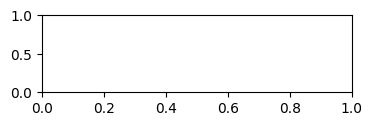

In [40]:
# Knowing proportion anomalies (nan, inf, more_than_1)
def proportion_anomalies():
    nan_oneoff_proportion = np.isnan(ONEOFF_PROPORTION).sum()
    nan_installments_proportion = np.isnan(INSTALLMENTS_PROPORTION).sum()
    inf_oneoff_proportion = np.isinf(ONEOFF_PROPORTION).sum()
    inf_installments_proportion = np.isinf(INSTALLMENTS_PROPORTION).sum()
    more_than_1_oneoff_proportion = len(ONEOFF_PROPORTION[ONEOFF_PROPORTION > 1])
    more_than_1_installments_proportion = len(INSTALLMENTS_PROPORTION[INSTALLMENTS_PROPORTION > 1])

    proportion_anomalies = pd.DataFrame({'nan': [nan_oneoff_proportion, nan_installments_proportion],
                                        'inf': [inf_oneoff_proportion, inf_installments_proportion],
                                        'more_than_1': [more_than_1_oneoff_proportion, more_than_1_installments_proportion]},
                                        index=['oneoff_proportion', 'installments_proportion'])

    return proportion_anomalies

In [41]:
proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,2044,0,3
installments_proportion,2042,2,14


In [42]:
df[np.isnan(INSTALLMENTS_PROPORTION)].loc[:, ['PURCHASES', 'INSTALLMENTS_PURCHASES']].value_counts()

PURCHASES  INSTALLMENTS_PURCHASES
0.0        0.0                       2042
dtype: int64

In [43]:
df[np.isnan(ONEOFF_PROPORTION)].iloc[:, 2:4].value_counts()

PURCHASES  ONEOFF_PURCHASES
0.0        0.0                 2044
dtype: int64

Nous avons noté qu'il y a 2041 valeurs manquantes et 3 valeurs supérieures à 1 dans oneoff_proportion et 2039 valeurs manquantes, 2 nombres infinis et 14 valeurs supérieures à 1.
Comme il s'agit d'une valeur inhabituelle, nous avons décidé de la transformer en valeur raisonnable.
- La valeur manquante est due à la valeur zéro de oneoff_purchase/installment_purchase divisée par la valeur zéro de purchases. Nous remplirons la valeur manquante avec la valeur zéro.
- Le nombre infini est dû à la valeur de l'achat effectué en plusieurs fois divisée par la valeur zéro de l'achat. Nous avons décidé de changer le nombre en 1, nous supposons que tous les achats sont effectués par paiement échelonné.
- Pour toutes les valeurs supérieures à 1, nous avons décidé de remplacer le nombre par 1, car la nature de la caractéristique est la proportion, et la valeur maximale est 1.


In [44]:
# Fill NaN value with zero value
ONEOFF_PROPORTION.fillna(0, inplace=True)
INSTALLMENTS_PROPORTION.fillna(0, inplace=True)

# check anomalies
proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,3
installments_proportion,0,2,14


In [45]:
df.iloc[INSTALLMENTS_PROPORTION[INSTALLMENTS_PROPORTION == np.inf].index].iloc[:,2:5]

,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES
4682,0.0,0.0,20.00
5737,0.0,0.0,66.95


In [47]:
inf_to_1 = INSTALLMENTS_PROPORTION[INSTALLMENTS_PROPORTION == np.inf].index
INSTALLMENTS_PROPORTION.iloc[inf_to_1] = 1

proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,3
installments_proportion,0,0,12


In [48]:

oneoff_more_than_1 = ONEOFF_PROPORTION[ONEOFF_PROPORTION > 1].index
ONEOFF_PROPORTION.iloc[oneoff_more_than_1] = 1

installments_more_than_1 = INSTALLMENTS_PROPORTION[INSTALLMENTS_PROPORTION > 1].index
INSTALLMENTS_PROPORTION.iloc[installments_more_than_1] = 1

proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,0
installments_proportion,0,0,0


In [49]:
# change the oneoff_purchase with oneoff_proportion and installment_purchase with installment_proportion
df_model.ONEOFF_PURCHASES = ONEOFF_PROPORTION
df_model.INSTALLMENTS_PURCHASES = INSTALLMENTS_PROPORTION

In [50]:
df_model.rename(columns={'ONEOFF_PURCHASES': 'ONEOFF_PROPORTION',
                     'INSTALLMENTS_PURCHASES': 'INSTALLMENTS_PROPORTION'},
            inplace=True)
df_model.head()

,BALANCE_FREQUENCY,ONEOFF_PROPORTION,INSTALLMENTS_PROPORTION,PURCHASES_FREQUENCY,ONEOFF_FREQUENCY,INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENT_PROPORTION
0,0.818182,0.0,1.0,0.166667,0.000000,0.083333,0.000000,0.000000
1,0.909091,0.0,0.0,0.000000,0.000000,0.000000,0.250000,0.222222
2,1.000000,1.0,0.0,1.000000,1.000000,0.000000,0.000000,0.000000
3,0.636364,1.0,0.0,0.083333,0.083333,0.000000,0.083333,0.000000
4,1.000000,1.0,0.0,0.083333,0.083333,0.000000,0.000000,0.000000


## 2. **Use hierarchical clustering to identify the inherent groupings within your data**

Pour la modélisation, nous avons décidé d'utiliser l'ACP avant de procéder au regroupement. En effet, l'ACP peut contribuer à réduire le nombre de caractéristiques pour faciliter l'interprétation et simplifier le modèle complexe dans la modélisation.

Pour les métriques, nous utiliserons :

**Silhouette Score**,  **Davies Bouldin Score**, **Calinski Harabasz Score**


In [51]:
# Model Init
number_of_cluster = np.arange(2,11) # Number of Clusters
np.random.seed(2022) # Set global randomseed for sklearn models

- **Principal Component Analysis**

In [52]:
#running PCA with full components
pca_all = PCA(n_components=len(df_model.columns), random_state = 2022)
pca_all.fit(df_model)
variance = pca_all.explained_variance_ratio_
var = np.cumsum(variance)*100

#plot for information extracted
fig = px.line(x=np.arange(len(df_model.columns))+1, y=var, markers=True)
fig.update_xaxes(title_text='# of Features')
fig.update_yaxes(title_text='% Variance Explained')
fig.update_layout(width=900)

In [53]:
#total information extracted after pca
print('information extracted {} %'.format(np.sum(variance[:2])*100/np.sum(variance)))

information extracted 74.3617753696997 %


In [55]:
# Reducing the dimensions of the data
pca_n = PCA(n_components = 2, random_state = 2022)
X_principal = pca_n.fit_transform(df_model)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']

summary_stats(X_principal)

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,P1,-0.8981,1.2076,2.1057,0.0,-0.0802,0.6634,0.2955,-1.424
1,P2,-0.8021,1.2440,2.0461,0.0,-0.1209,0.5193,0.4634,-0.921


- **Agglomerative Clustering**

**Le clustering agglomératif** est un clustering stratégique en clustering hiérarchique (les techniques de clustering forment une hiérarchie ou sont basées sur un certain niveau de sorte qu'elles ressemblent à une structure arborescente) en commençant par chaque objet dans un cluster séparé et en formant ensuite un clustering de plus en plus grand.
nous utilisons 3 liens dans la méthode agglomérative :
 1. **Liaison de Ward (somme des carrés de 2 grappes)** :
 Au lieu de mesurer directement la distance, Ward analyse la variance des grappes. La méthode de Ward est considérée comme la plus appropriée pour les variables quantitatives.
 2. **Liaison moyenne (somme de la moyenne ou de la liaison moyenne)** : La technique consiste à combiner les grappes en fonction de la distance entre elles.
La technique consiste à combiner les grappes en fonction de la distance moyenne de chaque paire de membres dans l'ensemble entre deux grappes.
 3.  **Lien complet (distance maximale ou lien complet)**
La technique consiste à combiner les grappes en fonction de la distance entre les membres les plus éloignés entre deux grappes.



In [56]:
# Create Accumulator for matric
ward_s_scores = []
ward_db_scores = []
ward_calinski_scores = []
average_s_scores = []
average_db_scores = []
average_calinski_scores = []
complete_s_scores = []
complete_db_scores = []
complete_calinski_scores = []

agglo_metrics = {'ward': [ward_s_scores, ward_db_scores, ward_calinski_scores, 'rgb(128,177,211)'],
                 'average': [average_s_scores, average_db_scores, average_calinski_scores, 'rgb(141,211,199)'],
                 'complete': [complete_s_scores, complete_db_scores, complete_calinski_scores, 'rgb(251,128,114)']}

for i, j in product(agglo_metrics, number_of_cluster):
    agglo = AgglomerativeClustering(linkage=i, n_clusters=j)
    agglo.fit(X_principal)
    agglo_metrics[i][0].append(silhouette_score(
        X_principal, agglo.labels_))
    agglo_metrics[i][1].append(davies_bouldin_score(
        X_principal, agglo.labels_))
    agglo_metrics[i][2].append(calinski_harabasz_score(
        X_principal, agglo.labels_))

In [63]:
min(agglo_metrics['ward'][1])

0.6180254248698763

'ward', 'average', 'complete'

In [64]:
min(agglo_metrics['average'][1])

0.6155575380864878

In [65]:
min(agglo_metrics['complete'][1])

0.7059657447553198

In [66]:
#silhouette score between each method
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.01)

for i in agglo_metrics:
    for j, k in zip(range(1, 4), ['Silhouette', 'Davies Bouldin', 'Calinski-Harabasz']):
        fig.append_trace(go.Scatter(x=list(number_of_cluster), y=agglo_metrics[i][j-1], name=i.title(),
                                    legendgroup=i, line_color=agglo_metrics[i][-1],
                                    showlegend=False if j != 1 else True), row=j, col=1)
        fig.update_yaxes(title_text=k, row=j, col=1)

fig.update_xaxes(title_text='Number of Clusters', row=3)
fig.update_layout(height=800, width=900,
                  legend_title_text='Metrics',
                  title_text='Agglomerative Clustering Metric Scores')

Les meilleurs  scores sont obtenus:

- pour le score de Silhouette:

Ward: 8 Clusters

Average: 7 Clusters

Complete: 7 Clusters

Average a les meilleurs performances

- pour le score de Davies Bouldin :

Ward: 3 Clusters

Average: 3 on Clusters

Complete: 7 Clusters

Ward a les meilleurs performances

- pour le score de Calinski Harabasz :

Ward: 9 Clusters

Average: 8 Clusters

Complete: 7 Clusters

Ward a les meilleurs performances


## 3. **Plot the clusters**

Pour la  Nous allons nous limiter aux resultats du  score de Silhouette:

In [85]:
#creating new dataframe for agglomerative clustering
df_dend_s_Silhouette = X_principal.copy()
#df_dend_D_Bouldin = X_principal.copy()
#df_dend_C_Harabasz  = X_principal.copy()

In [78]:
#adding new columns for ward
agg_ward = AgglomerativeClustering(n_clusters=8, linkage='ward')
df_dend_s_Silhouette['ward'] = agg_ward.fit_predict(X_principal)

#adding new columns for average
agg_average = AgglomerativeClustering(n_clusters=7, linkage='average')
df_dend_s_Silhouette['average'] = agg_average.fit_predict(X_principal)

#adding new columns for complete
agg_complete = AgglomerativeClustering(n_clusters=7, linkage='complete')
df_dend_s_Silhouette['complete'] = agg_complete.fit_predict(X_principal)


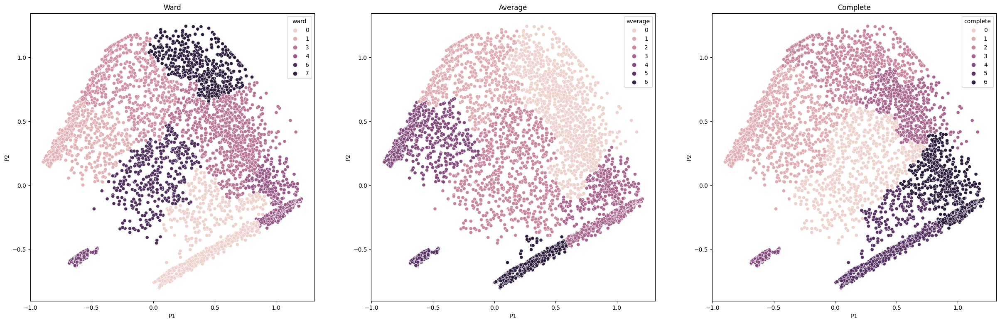

In [79]:
#creating visualization to compare the result from the best score for each agglomerative clustering method
num, hue = 0, ['ward', 'average', 'complete']
plt.figure(figsize=(30, 9))
for i in hue:
    num += 1
    plt.subplot(1, 3, num)
    sns.scatterplot(x='P1', y='P2', hue=i, data=df_dend_s_Silhouette)
    plt.title(i.title())

 Par conséquent, nous choisissons la méthode Average comme représentant du clustering agglomératif puisque le nombre de clusters est de 7 et que le score est également bon.

## 4. **Plot the dendrogram**

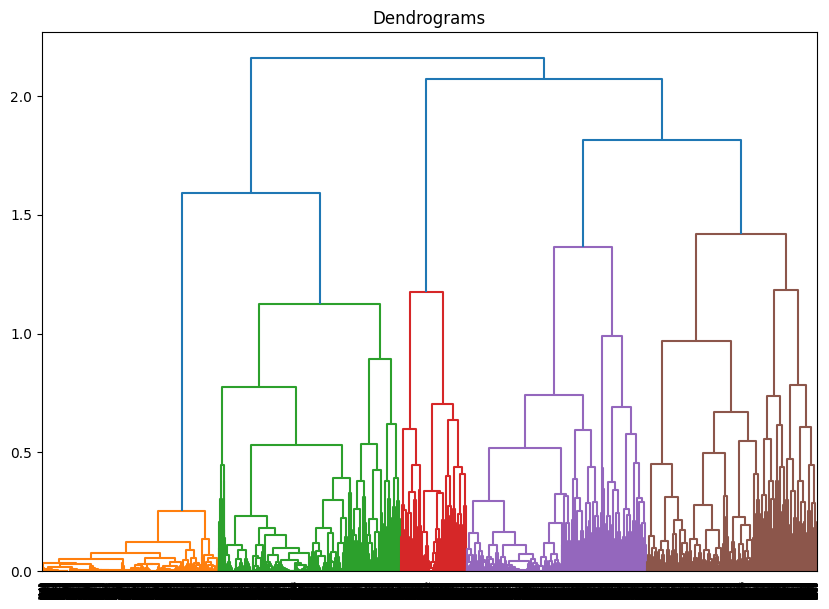

In [92]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))
plt.title("Dendrograms")
dend=shc.dendrogram(shc.linkage(X_principal, method="complete"))


Nous avons 5 groupes. Pour armoniser nous Allons considerer 5 clusters pour le modèle finale

In [101]:
#model final
agg_mod_fin = AgglomerativeClustering(n_clusters=5, linkage='average').fit(X_principal)


In [111]:
agg_silhouette_score=silhouette_score(X_principal, agg_mod_fin.labels_)
agg_db_score= davies_bouldin_score(X_principal, agg_mod_fin.labels_)
agg_ch_score= calinski_harabasz_score(X_principal, agg_mod_fin.labels_)

-  **Use K-Means clustering**

**K-Means**  est une méthode de partitionnement en grappes qui sépare les données en différentes grappes. Par partitionnement itératif, cette méthode permet de minimiser la moyenne de la distance de chaque donnée à sa grappe.

 ## 5. **Try different k values and select the best one**

In [93]:
#creating list for scoring
avg_withinSS = []

#create loop to run the algorithm
for i in number_of_cluster:
    kmeans = KMeans(n_clusters=i, random_state = 2022)
    kmeans.fit(X_principal)
    centroids = kmeans.cluster_centers_

    D_k = cdist(X_principal, centroids, 'euclidean')
    cIdx = np.argmin(D_k, axis=1)
    dist = np.min(D_k, axis=1)
    avg_withinSS.append(sum(dist)/X_principal.shape[0])

#creating plot for elbow method visualization
fig = px.line(x=number_of_cluster, y=avg_withinSS, markers=True)
fig.update_xaxes(title_text='Number of Clusters')
fig.update_yaxes(title_text='Average Within Sum of Square')
fig.update_layout(width=900)

À première vue, nous pouvons segmenter avec 4 ou 5 groupes parce que c'est la diminution la plus significative.


In [94]:
# Create Accumulator for matric
kmeans_s_scores = []
kmeans_db_scores = []
kmeans_calinski_scores = []

#looping for modeling
for i in number_of_cluster:
    kmeans = KMeans(n_clusters=i, random_state = 2022)
    kmeans.fit(X_principal)
    kmeans_labels = kmeans.predict(X_principal)
    kmeans_s_scores.append(silhouette_score(
        X_principal, kmeans_labels, metric='euclidean'))
    kmeans_db_scores.append(davies_bouldin_score(X_principal, kmeans_labels))
    kmeans_calinski_scores.append(
        calinski_harabasz_score(X_principal, kmeans_labels))

In [95]:
#creating plot for scoring visualization
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.01)
kmeans_score = {'Silhouette': kmeans_s_scores,
                'Davies Bouldin': kmeans_db_scores,
                'Calinski-Harabasz': kmeans_calinski_scores}

for i, score in zip(np.arange(1, 4), kmeans_score):
    fig.append_trace(go.Scatter(
        x=list(number_of_cluster), y=kmeans_score[score], name=score), row=i, col=1)
    fig.update_yaxes(title_text=score, row=i, col=1)

fig.update_xaxes(title_text='Number of Clusters', row=3)
fig.update_layout(height=800, width=900,
                  showlegend=False,
                  title_text='Metric Scores')


nous avons décidé d'utiliser 4 groupes en supposant qu'il y a une diminution progressive de la méthode du coude plus douce, le score de Silhouete et le score de Calinski Harabasz ne sont pas les plus élevés mais suffisants parce que 4 est le point où le score augmente de manière significative, lorsque l'on considère le score de Boudin Davies, il devient également le score le plus élevé des autres.


In [97]:
#choosing 4 cluster as the best number of cluster
kmeans = KMeans(n_clusters=4, random_state = 2022)
kmeans.fit(X_principal)

KMeans(n_clusters=4, random_state=2022)

In [98]:
#plot to visualize the result
fig = px.scatter(X_principal, x='P1', y='P2',
                 color=list(map(lambda x: str(x), kmeans.labels_)))
fig.add_trace(go.Scatter(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1], mode='markers',
                         marker_color='rgba(152, 0, 0, .8)', marker_size=15, name='Centroids'))

fig.update_xaxes(title_text='P1')
fig.update_yaxes(title_text='P2')
fig.update_layout(height=700, width=800,
                  legend_title_text='Clusters',
                  title_text='K-Means with 4 Clusters')

In [105]:
#model final
KMean_mod_fin =KMeans(n_clusters=4, random_state = 2022).fit(X_principal)


In [110]:
kmeans_silhouette_score=silhouette_score(X_principal, KMean_mod_fin.labels_)
kmeans_db_score= davies_bouldin_score(X_principal, kmeans_labels)
kmeans_ch_score= calinski_harabasz_score(X_principal, kmeans_labels)

##7. **Compare the two results.**

nous comparerons les meilleurs groupes de chaque modèle :
1. Modèle agglomératif avec lien moyen, n cluster = 5
2. K Means, n Cluster = 4


In [112]:
df_compare = pd.DataFrame({'Model' : ['Agglomerative (Average)', 'K-Means'],
              'N Cluster' : [5, 4],
              'Silhouette Score' : [agg_silhouette_score, kmeans_silhouette_score],
              'Devies Bouldin Score' : [agg_db_score, kmeans_db_score],
              'Calinski Harabasz Score' : [agg_ch_score, kmeans_ch_score]
                           })
df_compare

,Model,N Cluster,Silhouette Score,Devies Bouldin Score,Calinski Harabasz Score
0,Agglomerative (Average),5,0.556470,0.743856,12885.303413
1,K-Means,4,0.594193,0.640022,25498.790082
